In [1]:
import numpy as np
import pandas as pd
import sklearn
from sklearn.linear_model import LinearRegression
import pickle

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [2]:
print(f"numpy=={np.__version__}")
print(f"pandas=={pd.__version__}")
print(f"sklearn=={sklearn.__version__}")
print(f"matplotlib=={matplotlib.__version__}")

numpy==1.26.4
pandas==2.3.1
sklearn==1.4.2
matplotlib==3.10.5


In [3]:
# path to data
general_path = 'classif_matched_donorbased'
# path to results
path_results = "results_matched_donorbased"

# import dictionary of training set proportions
with open(f'helper_pickle_files/donorbased_proportion_dictionary.pickle', 'rb') as file:
    full_dict = pickle.load(file)
    training_counts_dict = full_dict["training_sets"]
    male_test_counts_dict = full_dict["male_test_sets"]
    female_test_counts_dict = full_dict["female_test_sets"]

# categories of behavior
results_df = pd.DataFrame(columns=['Cell type', 'Slope test', 'Flip test'])

### Functions to gather data:

In [4]:
def det_ann_level(cell_type, cell_names):
    if cell_type in cell_names["ann_2"]:
        ann_level = "ann_2"
    elif cell_type in cell_names["ann_3"]:
        ann_level = "ann_3"
    elif cell_type in cell_names["ann_4"]:
        ann_level = "ann_4"
    else:
        ann_level = "ann_finest"
    return ann_level


def gather_cms(general_path, seed, ann_level, cell_names, cell_type): 
    print(ann_level)
    male_lst = []
    female_lst = []
    
    text_proportions = ['0', '01', '02', '03', '04', '05', '06', '07', '08', '09', '1']
    for p in text_proportions:
        male_file_path = f'{general_path}/{seed}/{ann_level}/{p}_male_metrics.pickle'
        female_file_path = f'{general_path}/{seed}/{ann_level}/{p}_female_metrics.pickle'
    
        with open(male_file_path, 'rb') as file:
            male_results = pickle.load(file)
        with open(female_file_path, 'rb') as file:
            female_results = pickle.load(file)
    
        male_lst.append(pd.DataFrame(male_results['normalized_aggregated_confusion_matrix'], columns=cell_names[ann_level], index=cell_names[ann_level]))
        female_lst.append(pd.DataFrame(female_results['normalized_aggregated_confusion_matrix'], columns=cell_names[ann_level], index=cell_names[ann_level]))

    return male_lst, female_lst

Import manually defined cell names and color map dictionaries:

In [5]:
with open('helper_pickle_files/cell_names.pickle', 'rb') as file:
    cell_names = pickle.load(file)

In [6]:
with open('helper_pickle_files/color_mappings.pickle', 'rb') as file:
    color_mappings = pickle.load(file)

### Helper functions for plotting

In [7]:
def compute_difference(arr1, arr2):
    max_diff = float('-inf')
    
    for i in range(len(arr1)):
        diff = abs(arr1[i] - arr2[i])
        if diff > max_diff:
            max_diff = diff
    return max_diff

In [8]:
def plot_combined_classif(cell_type, classified, female_lst, male_lst, cell_counts_dict):
    proportions = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]

    fig = plt.figure(figsize=(12, 8))
    gs = fig.add_gridspec(2, 2, width_ratios=[20, 1], 
                          height_ratios=[2, 1], wspace=0.05, hspace = 0.3)

    ax1 = fig.add_subplot(gs[0, 0])  # line plot
    ax2 = fig.add_subplot(gs[1, 0])  # heatmap
    cax = fig.add_subplot(gs[1, 1])  # colorbar

    ###  line plot (classification trend)
    female_performance = [female_lst[prop].loc[cell_type, classified] for prop in range(len(proportions))]
    male_performance   = [male_lst[prop].loc[cell_type, classified] for prop in range(len(proportions))]

    max_diff = compute_difference(female_performance, male_performance)

    ax1.plot(proportions, female_performance, color='brown', label='Female test set', lw=2.5)
    ax1.plot(proportions, male_performance, color='darkblue', label='Male test set', lw=2.5)
    ax1.set_ylabel('% correctly classified cells', fontsize=15)
    # ax1.set_xlabel('% of female cells in training set', fontsize=15)
    ax1.legend(fontsize=15)
    ax1.grid(ls='--')

    yticks = ax1.get_yticks()
    ax1.set_yticks(yticks)
    ax1.set_yticklabels([f"{y:.2f}" for y in yticks], fontsize=12)
    ax1.set_ylim(max(ax1.get_ylim()[0], 0), min(ax1.get_ylim()[1], 1.01))
    ax1.set_xticks(proportions)
    ax1.set_xticklabels(proportions, fontsize = 12)
    # ax1.set_xticklabels([])
    ax1.set_title(f'{cell_type} (Matched Donor-based setting)', fontsize=18)

    ### heatmap (training counts)
    data = []
    for prop in proportions:
        counts = cell_counts_dict[f"prop_{prop}"].get(cell_type, (0, 0))
        total = counts[0] + counts[1]
        data.append([total, counts[0], counts[1]])

    heatmap_data = np.array(data).T

    # modified color map because full one looks bad with black text
    cmap = plt.get_cmap('YlOrBr', 256)  
    new_cmap = cmap(np.linspace(0, 0.85, 256))  # avoid darkest green
    
    y_edges = np.arange(4)-0.5
    y_centers = np.arange(3)
    x_centers = np.array(proportions)
    dx = (x_centers[1] - x_centers[0]) / 2
    x_edges = np.concatenate([[x_centers[0]-dx], (x_centers[:-1]+x_centers[1:])/2, [x_centers[-1]+dx]])

    
    mesh = ax2.pcolormesh(
        x_edges, y_edges,
        heatmap_data,
        cmap=plt.cm.colors.ListedColormap(new_cmap),
        edgecolors='w', linewidth=0.5
    )
    ax2.set_ylim(2.5, -0.5)

    for i, y in enumerate(y_centers):
        for j, x in enumerate(x_centers):
            ax2.text(x, y, str(heatmap_data[i, j]), va='center', ha='center', fontsize=10)

    ax2.set_xticks(x_centers)
    ax2.set_xticklabels(proportions, fontsize=12)
    ax2.set_yticks(np.arange(3))
    ax2.set_yticklabels(['Total', 'Male', 'Female'], fontsize=15)
    ax2.set_xlabel('% of female cells in training set', fontsize=15)
    # ax2.set_title(f'Training Set Counts', fontsize=14)

    cbar = fig.colorbar(mesh, cax=cax, orientation='vertical')
    cbar.ax.tick_params(labelsize=12)
    cbar.ax.set_title("Training\n cell counts", fontsize=12)

    
    # make x-limits exactly match ax1
    ax2.set_xlim(ax1.get_xlim())
    plt.show()


    ### save performance trend:
    slope_female = check_slope(female_performance, proportions)
    slope_male = check_slope(male_performance, proportions)
    flip = (female_performance[0] - male_performance[0])*(female_performance[-1] - male_performance[-1])
        # if flip < 0: a flip has occured
        # if flip > 0: female performance is better/worse than the male performance at both ends of the spectrum
    if slope_female and slope_male:
        prod = slope_female * slope_male < 0
    else:
        prod = None
    return (slope_female, slope_male), (prod, flip < 0), max_diff

### Helper function for determining trends

In [9]:
def check_slope(performance_values, proportions):
    try:
        model = LinearRegression().fit(np.reshape(proportions, (-1, 1)), np.reshape(performance_values, (-1, 1)))
        slope = model.coef_[0][0]
        return slope
    except ValueError as e:
        if "Input y contains NaN" in str(e):
            print(f"This cell type ({cell_type}) contains NaN values in a test set. Skipping slope calculation.")
        return None

### Investigate classifications per cell type

In [10]:
female_test_counts_dict['ann_finest']['AT0']

215

ann_finest


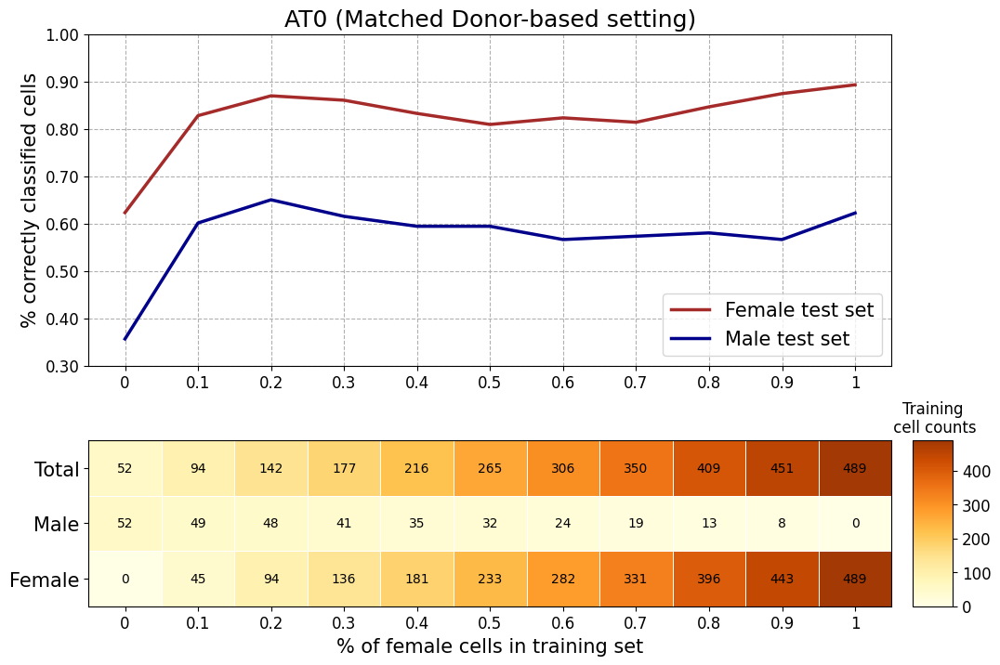

AT0 count in male test set: 143
AT0 count in female test set: 215
ann_3


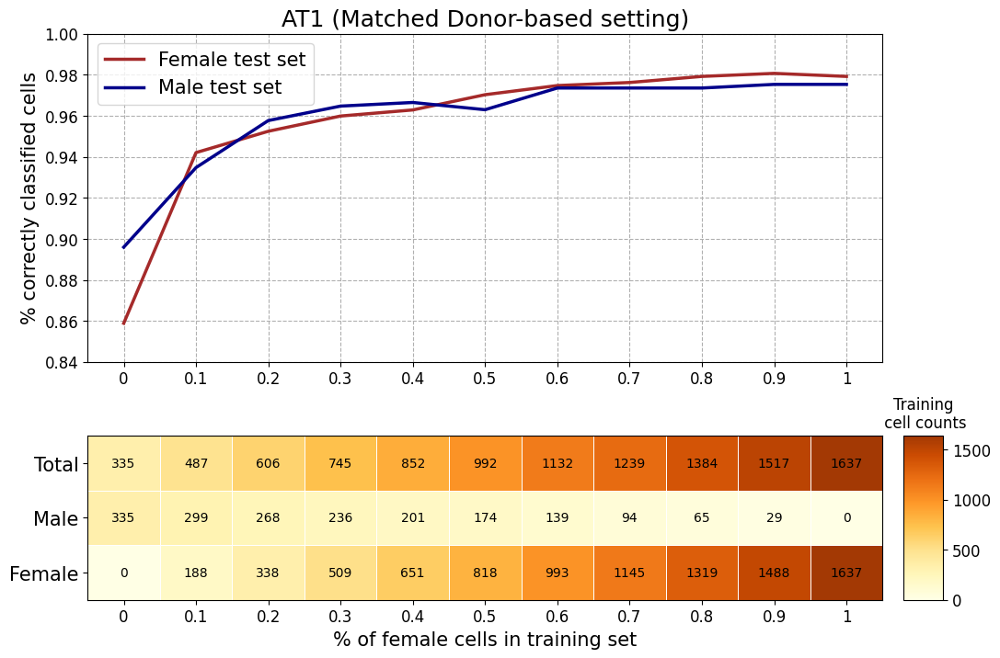

AT1 count in male test set: 567
AT1 count in female test set: 673
ann_3


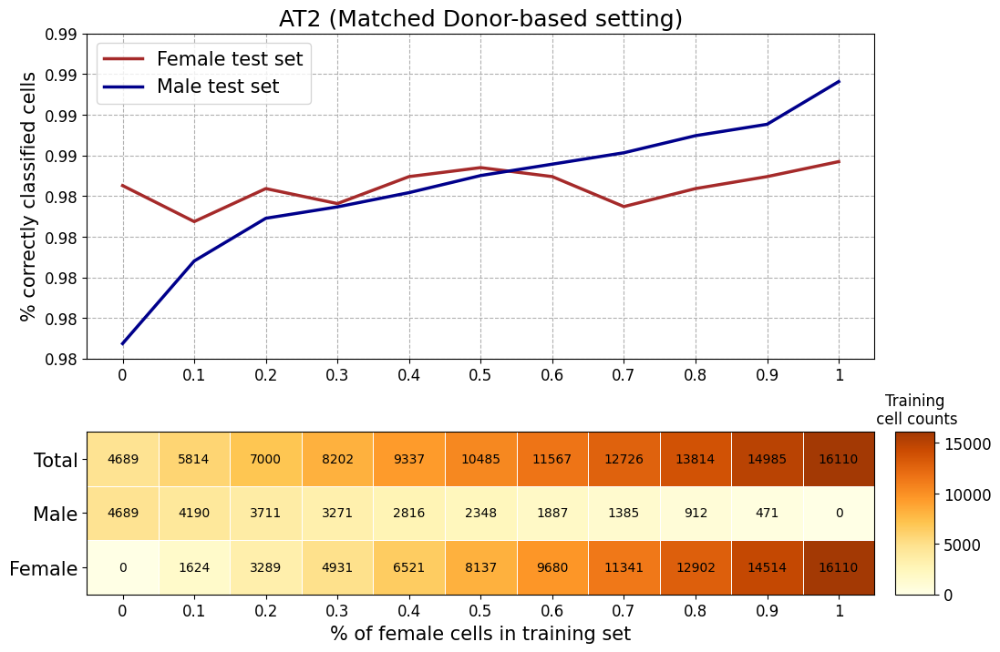

AT2 count in male test set: 7137
AT2 count in female test set: 6780
ann_4


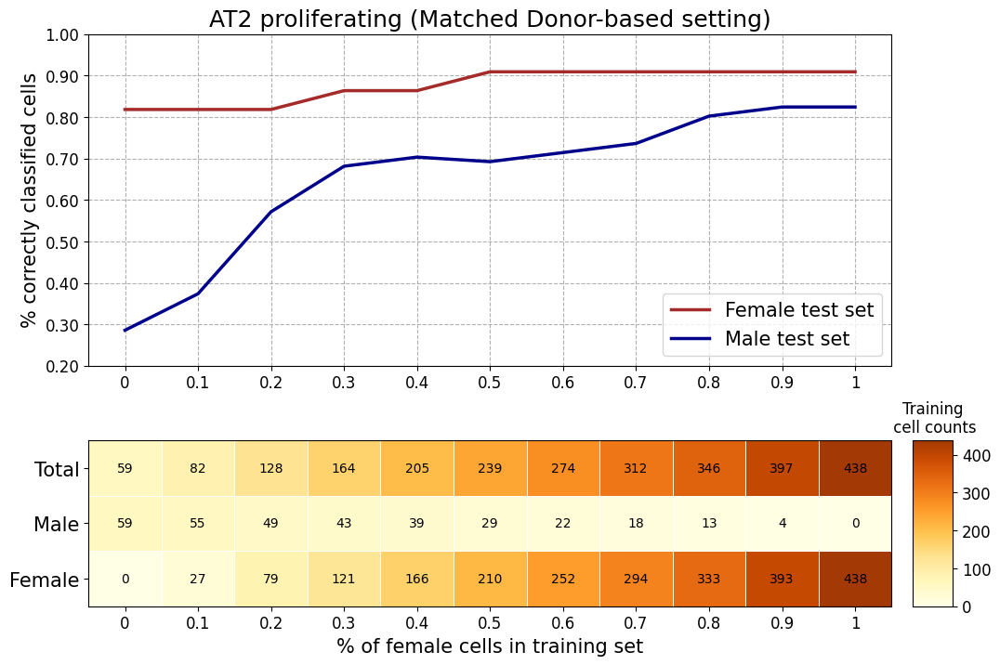

AT2 proliferating count in male test set: 91
AT2 proliferating count in female test set: 22
ann_4


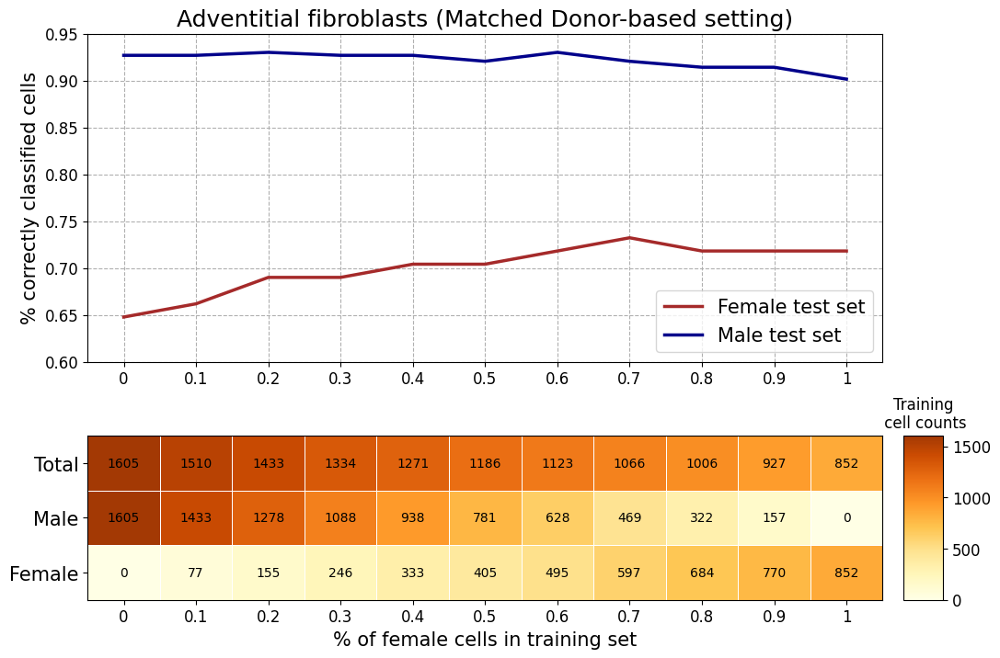

Adventitial fibroblasts count in male test set: 315
Adventitial fibroblasts count in female test set: 71
ann_finest


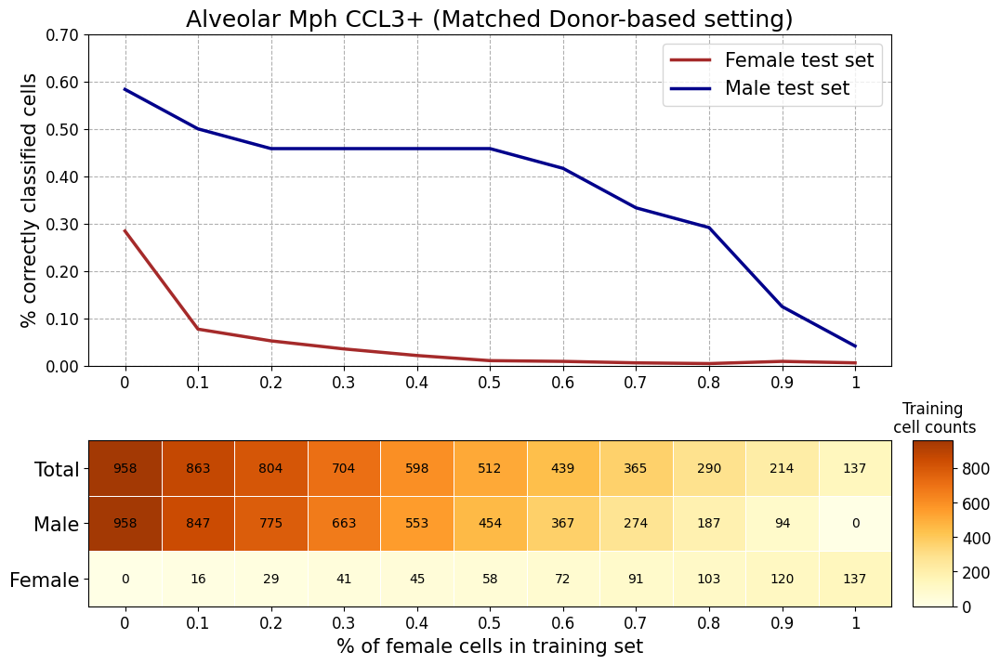

Alveolar Mph CCL3+ count in male test set: 24
Alveolar Mph CCL3+ count in female test set: 647
ann_finest


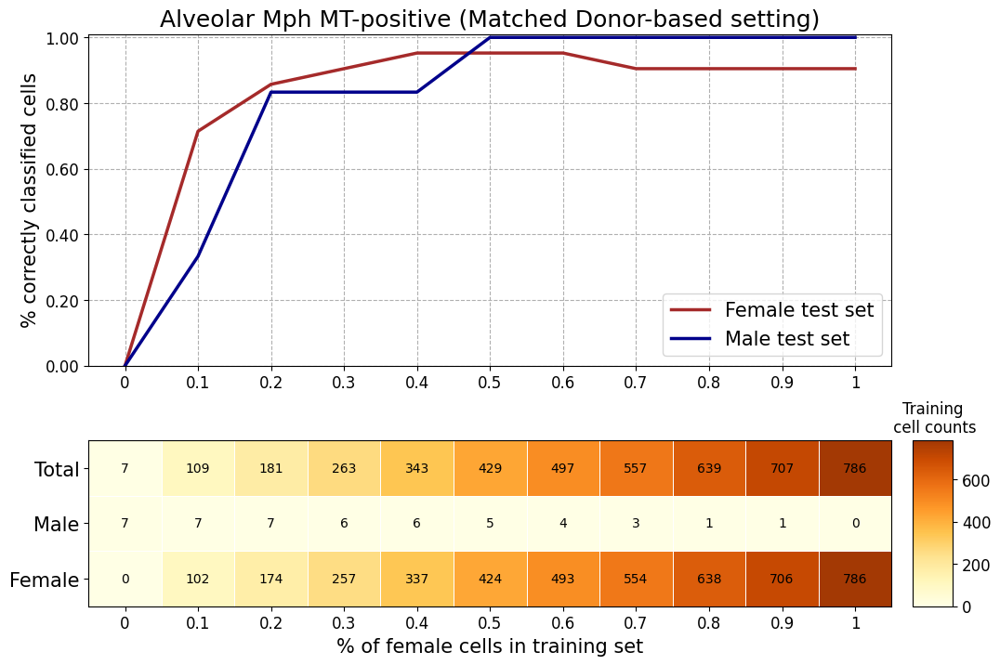

Alveolar Mph MT-positive count in male test set: 6
Alveolar Mph MT-positive count in female test set: 21
ann_finest


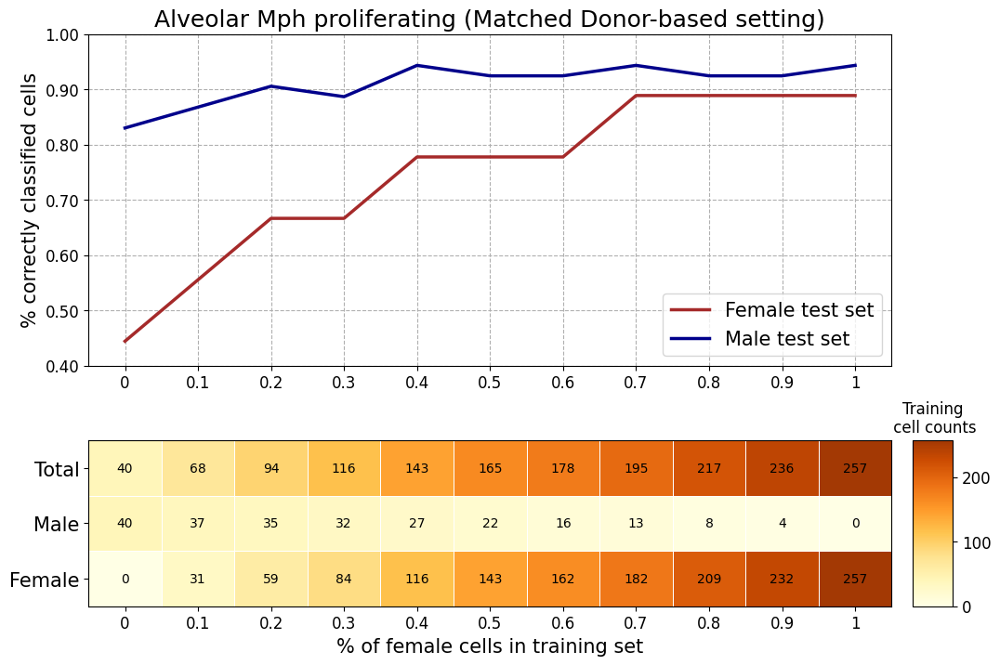

Alveolar Mph proliferating count in male test set: 53
Alveolar Mph proliferating count in female test set: 9
ann_4


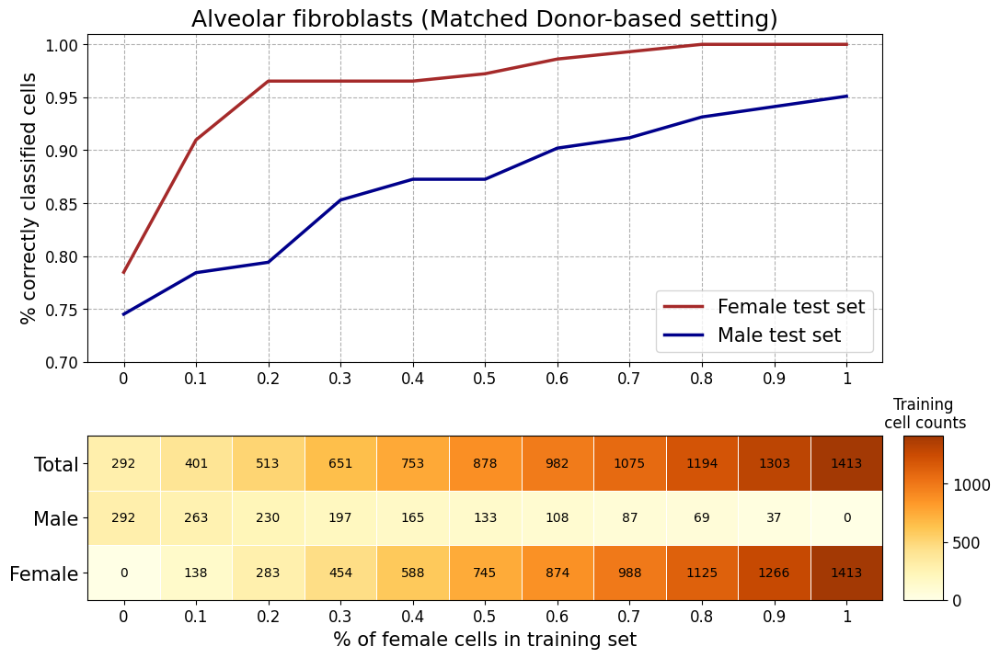

Alveolar fibroblasts count in male test set: 102
Alveolar fibroblasts count in female test set: 144
ann_4


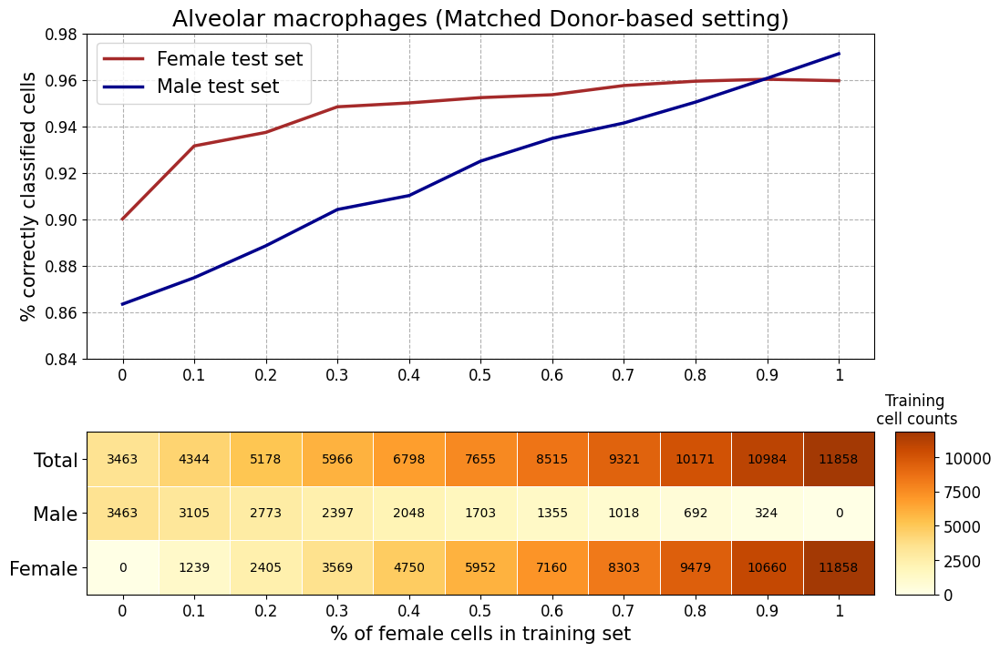

Alveolar macrophages count in male test set: 6336
Alveolar macrophages count in female test set: 4808
ann_4


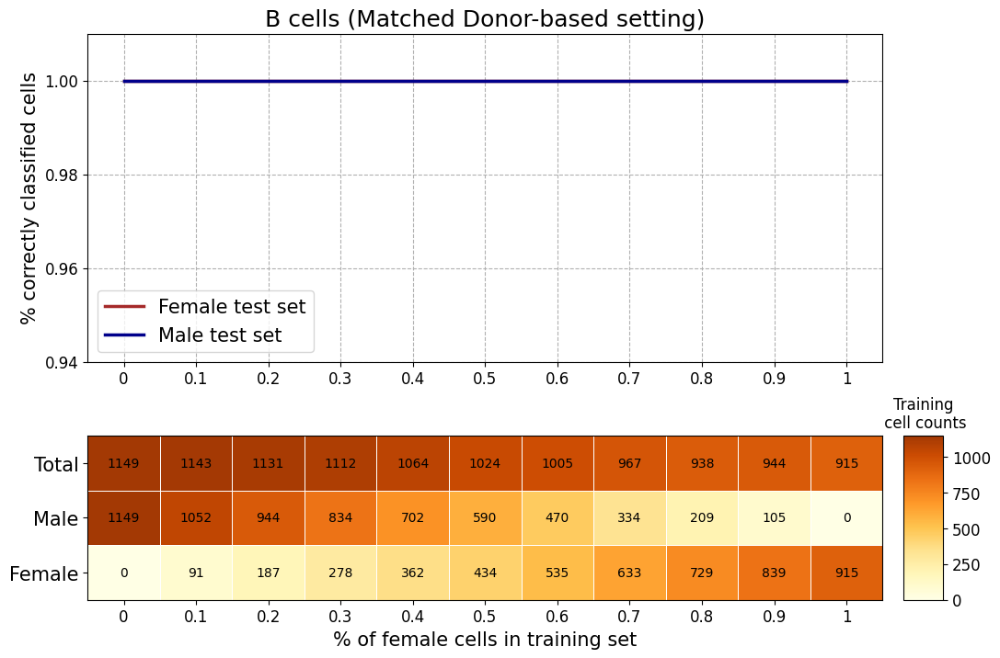

B cells count in male test set: 22
B cells count in female test set: 78
ann_4


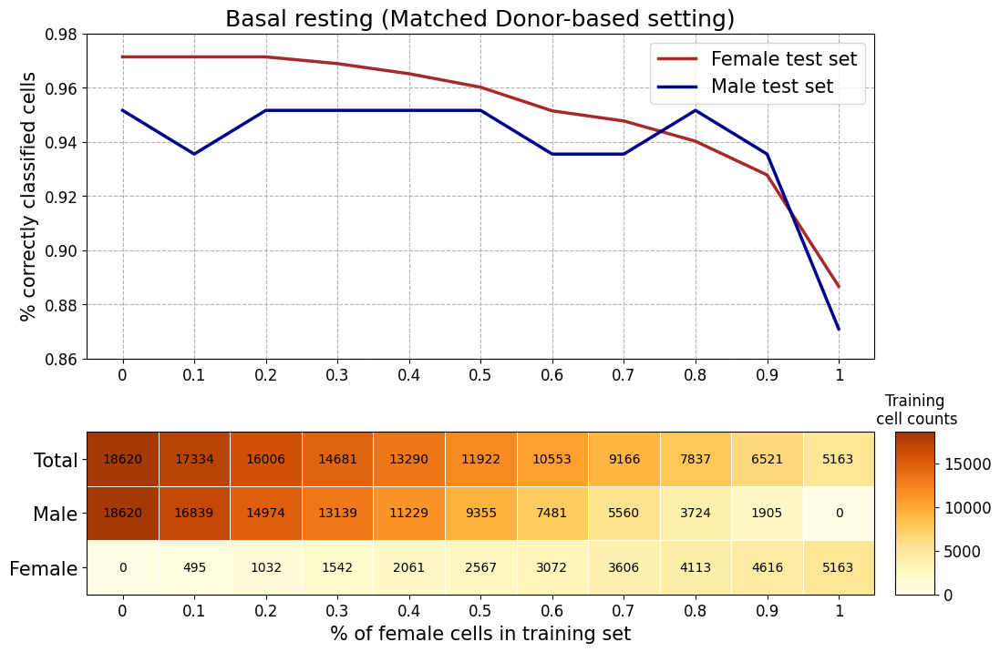

Basal resting count in male test set: 62
Basal resting count in female test set: 803
ann_4


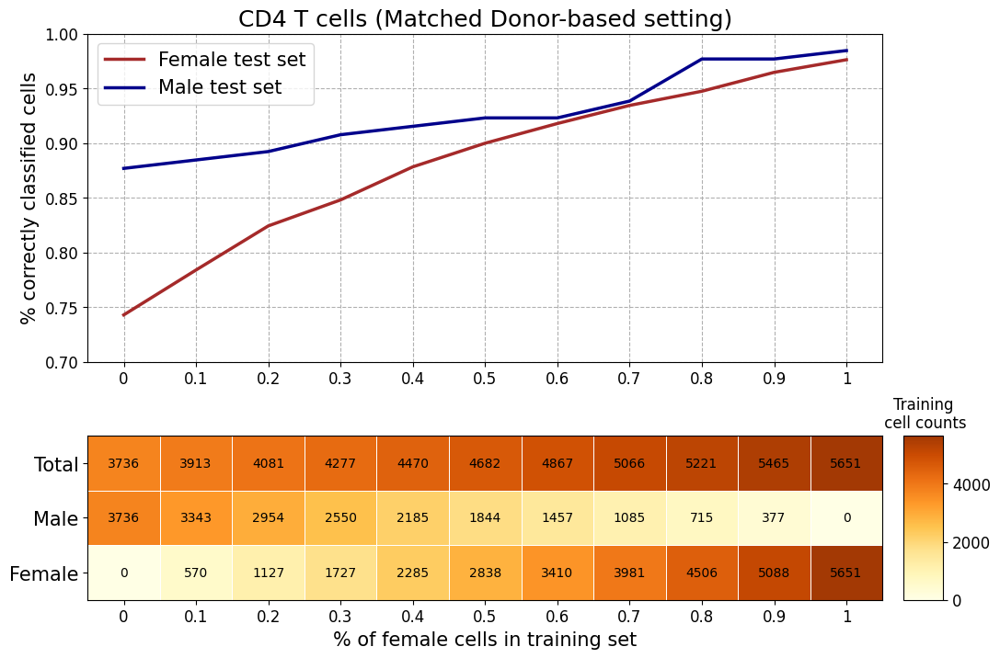

CD4 T cells count in male test set: 130
CD4 T cells count in female test set: 1389
ann_4


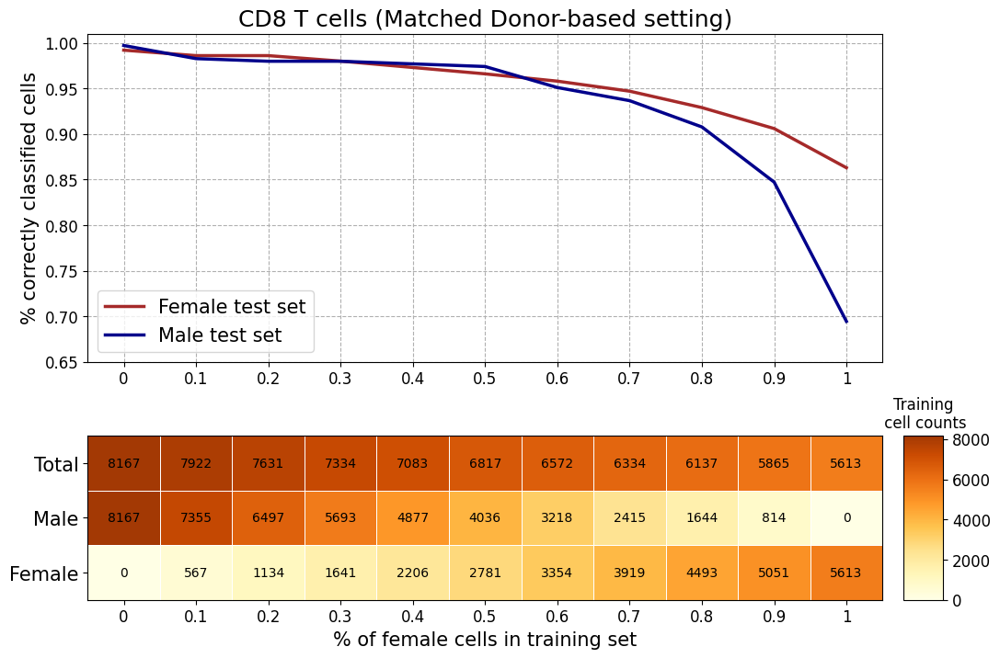

CD8 T cells count in male test set: 347
CD8 T cells count in female test set: 1000
ann_4


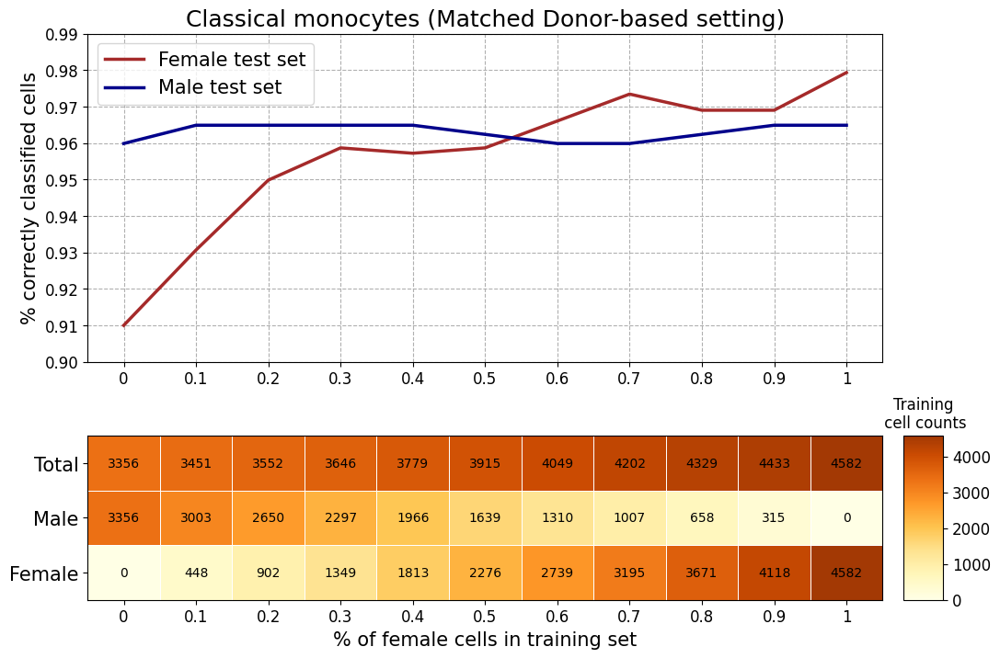

Classical monocytes count in male test set: 399
Classical monocytes count in female test set: 678
ann_finest


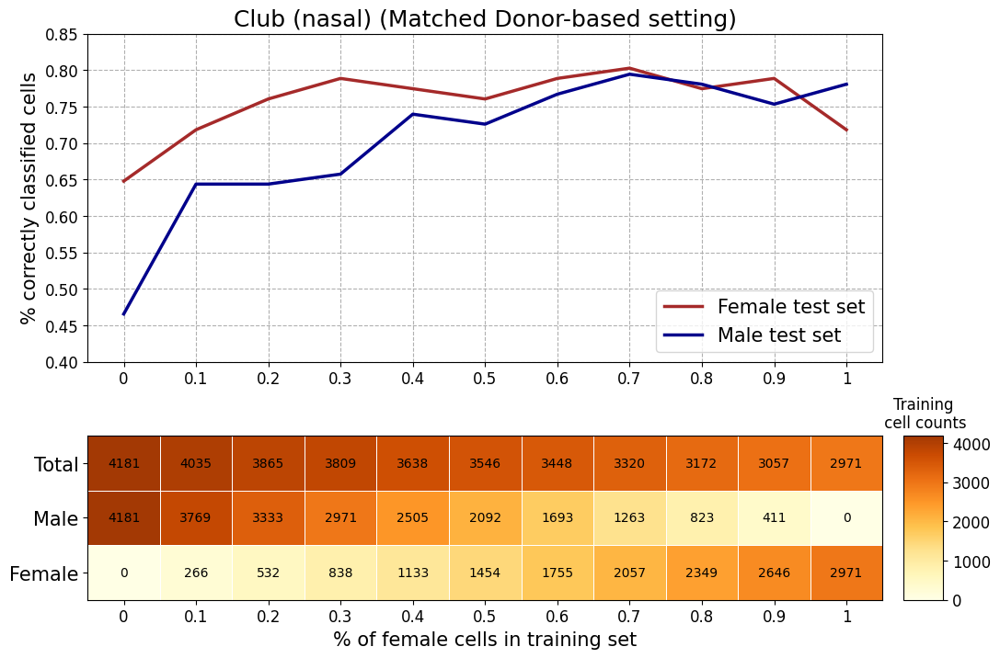

Club (nasal) count in male test set: 73
Club (nasal) count in female test set: 71
ann_finest


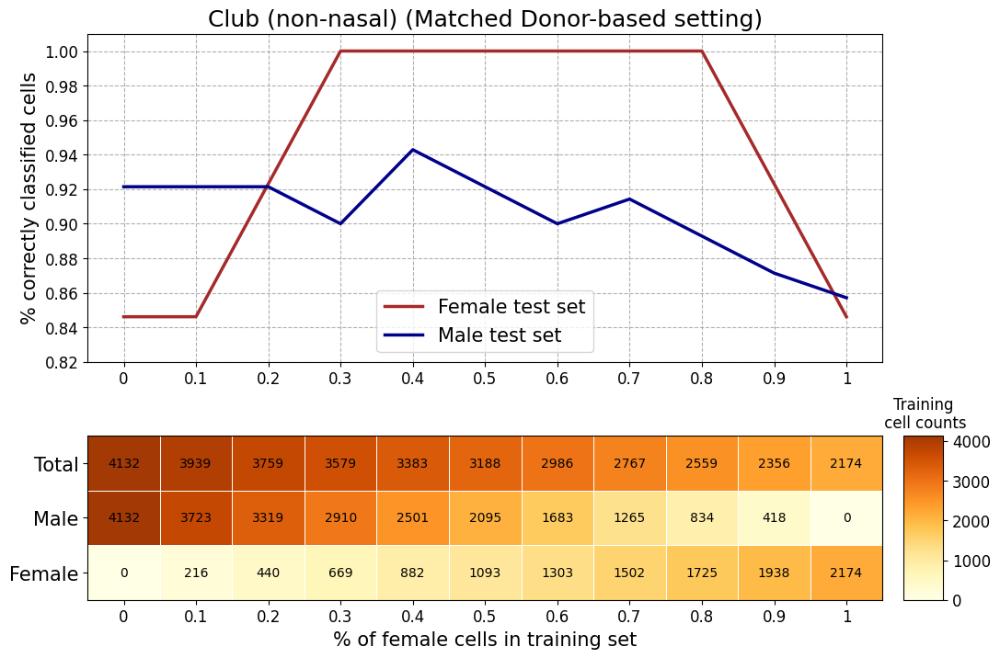

Club (non-nasal) count in male test set: 140
Club (non-nasal) count in female test set: 13
ann_4


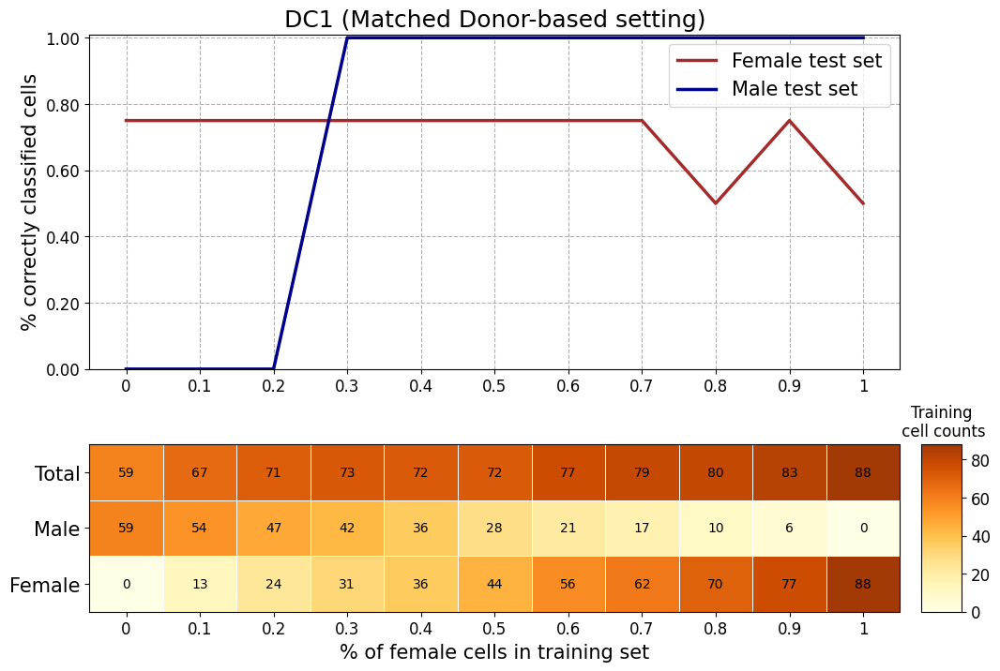

DC1 count in male test set: 1
DC1 count in female test set: 4
ann_4


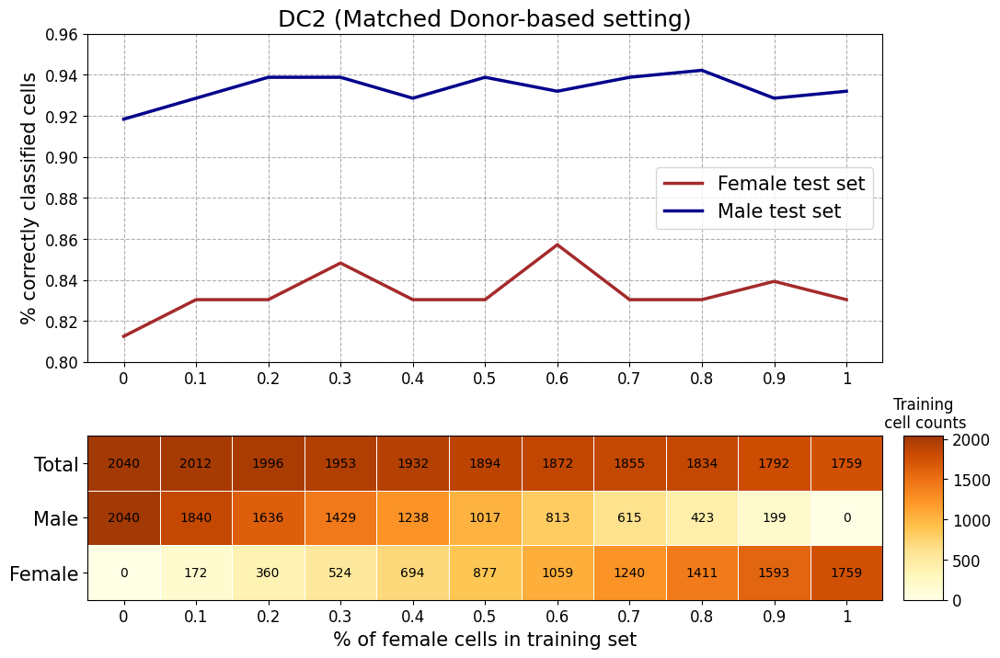

DC2 count in male test set: 294
DC2 count in female test set: 112
ann_4


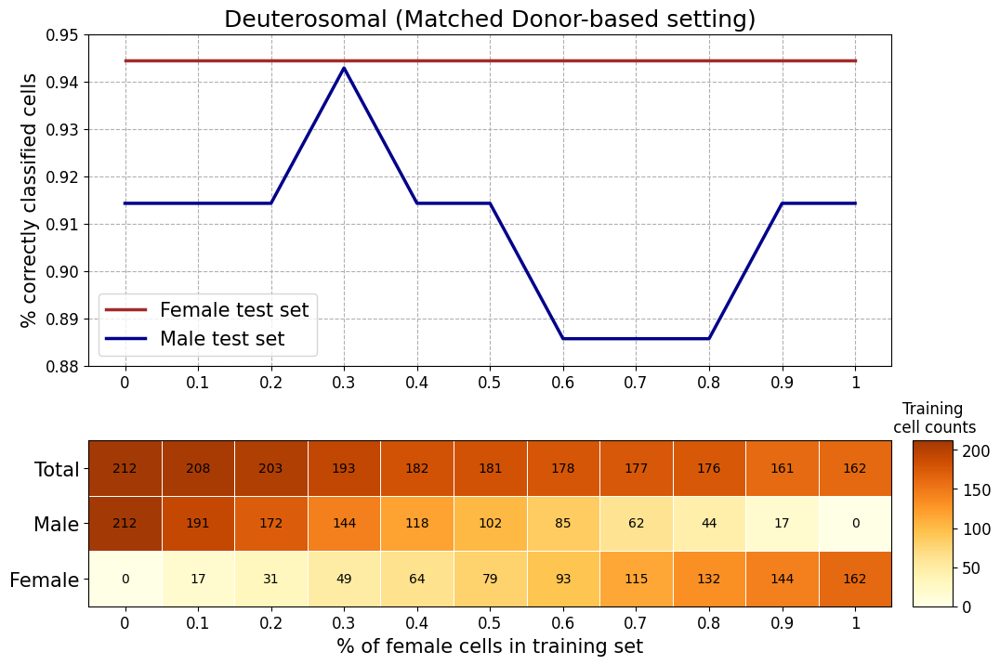

Deuterosomal count in male test set: 35
Deuterosomal count in female test set: 18
ann_4


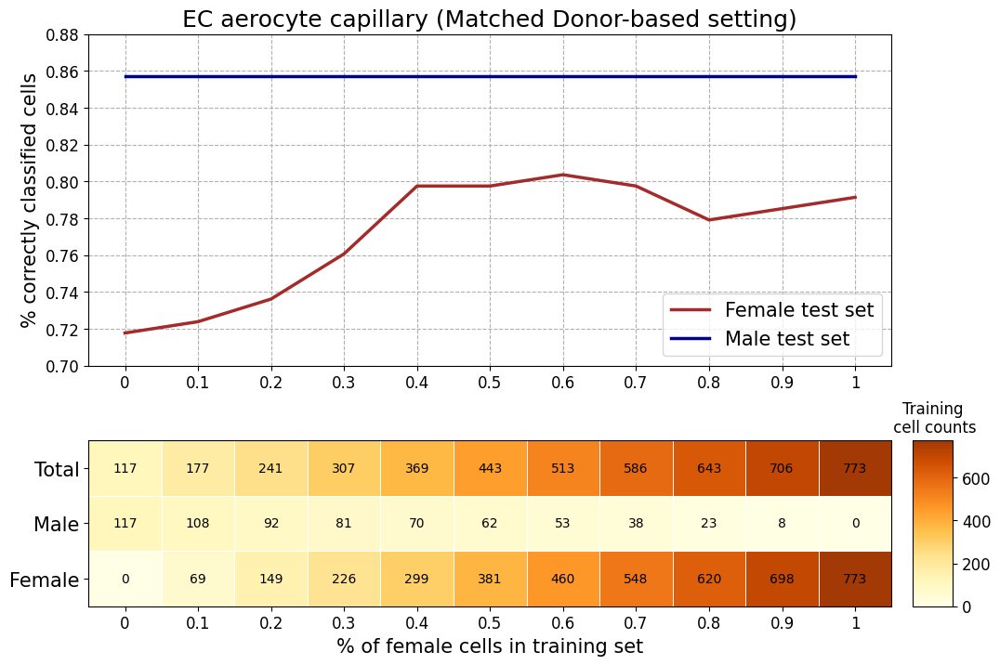

EC aerocyte capillary count in male test set: 7
EC aerocyte capillary count in female test set: 163
ann_3


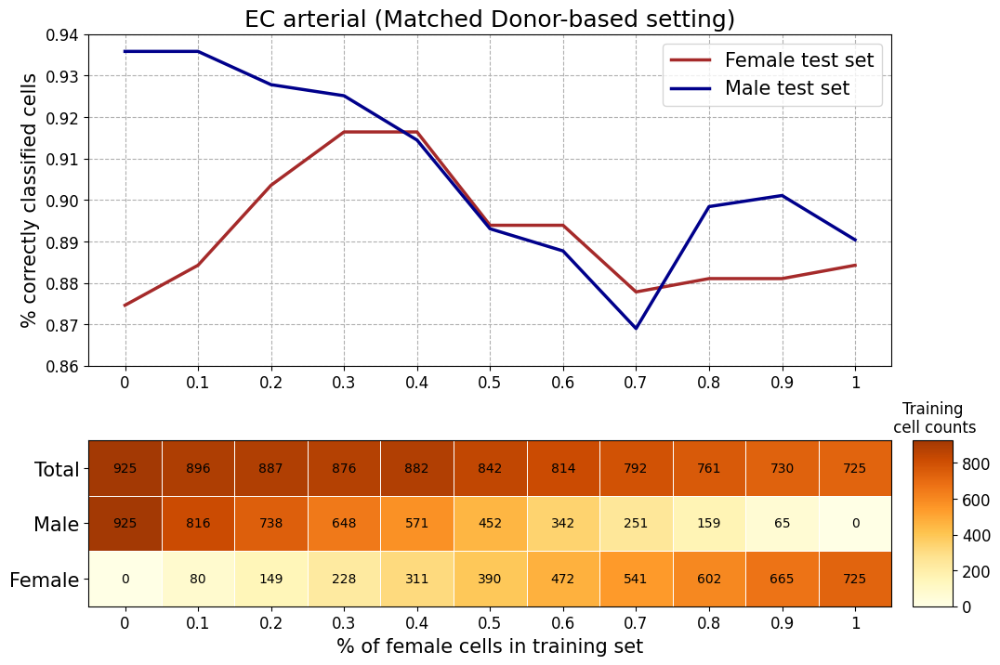

EC arterial count in male test set: 374
EC arterial count in female test set: 311
ann_4


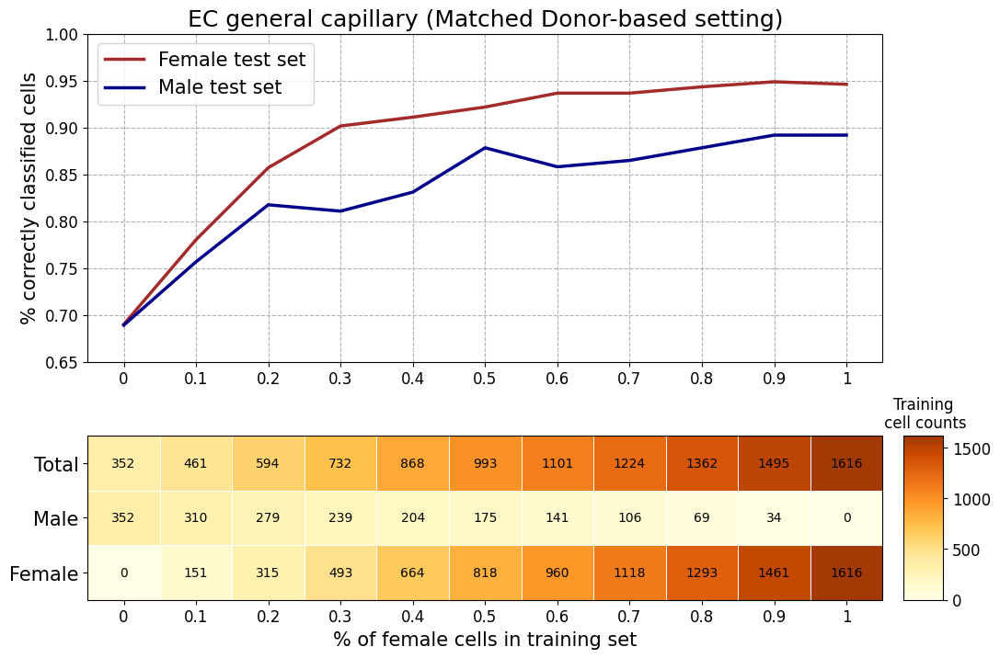

EC general capillary count in male test set: 148
EC general capillary count in female test set: 742
ann_4


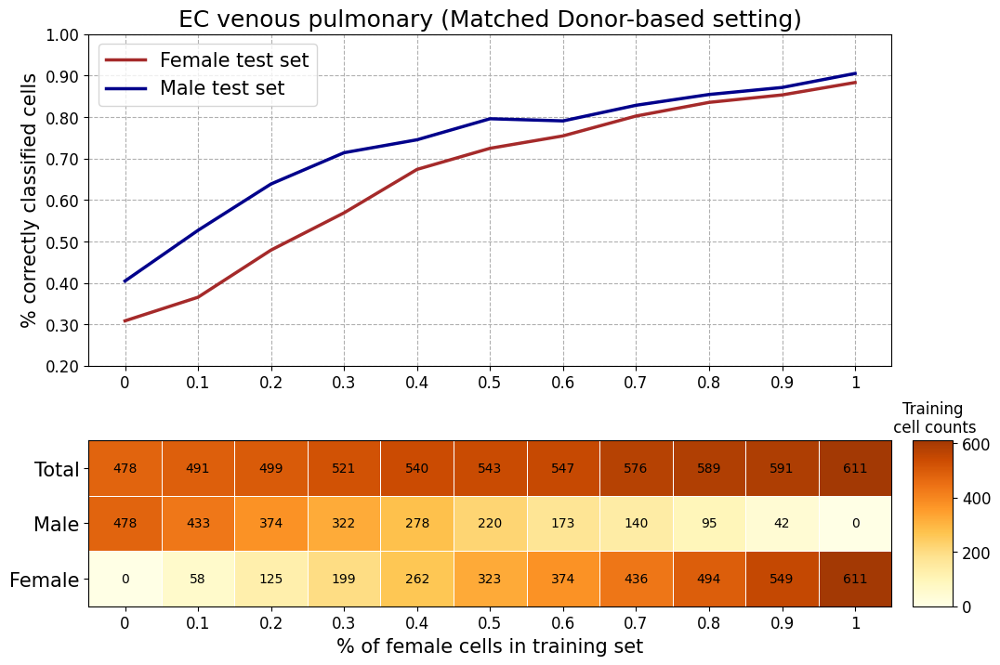

EC venous pulmonary count in male test set: 769
EC venous pulmonary count in female test set: 334
ann_4


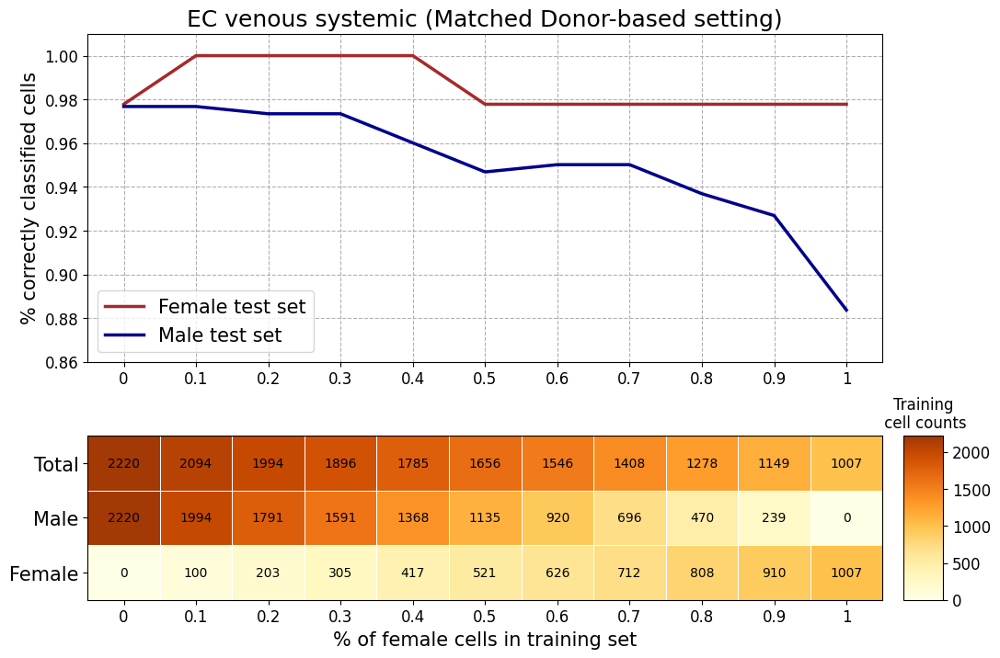

EC venous systemic count in male test set: 301
EC venous systemic count in female test set: 45
ann_finest


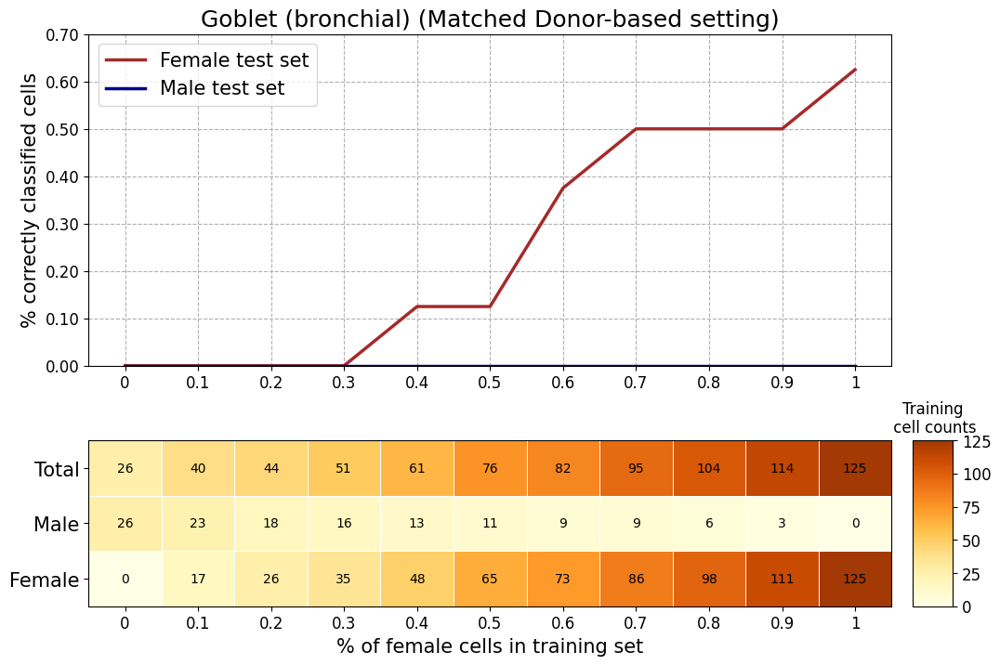

Goblet (bronchial) count in male test set: 3
Goblet (bronchial) count in female test set: 8
ann_finest


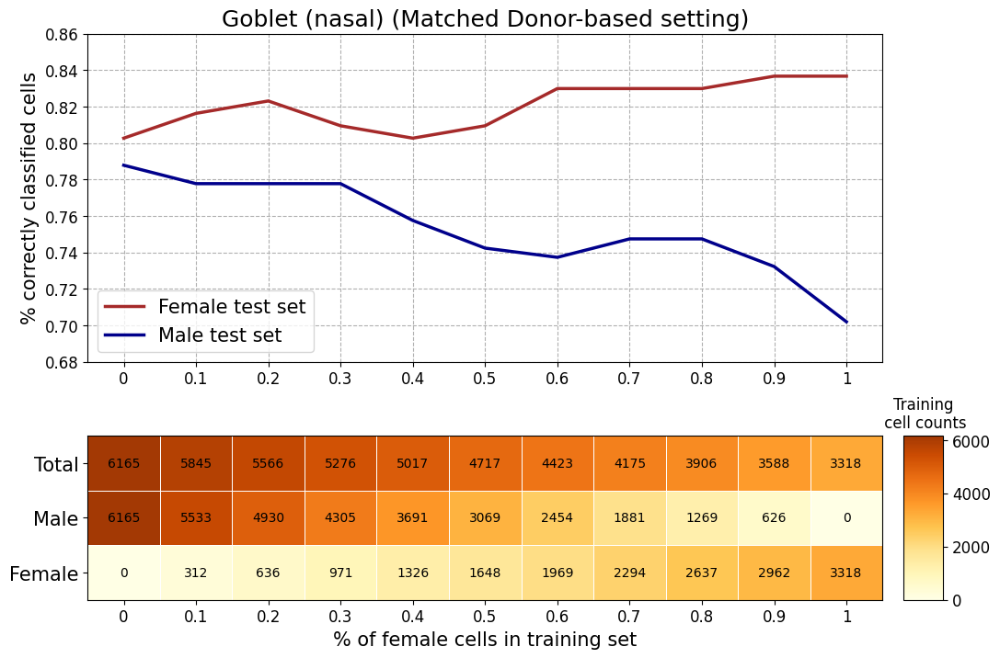

Goblet (nasal) count in male test set: 198
Goblet (nasal) count in female test set: 147
ann_finest


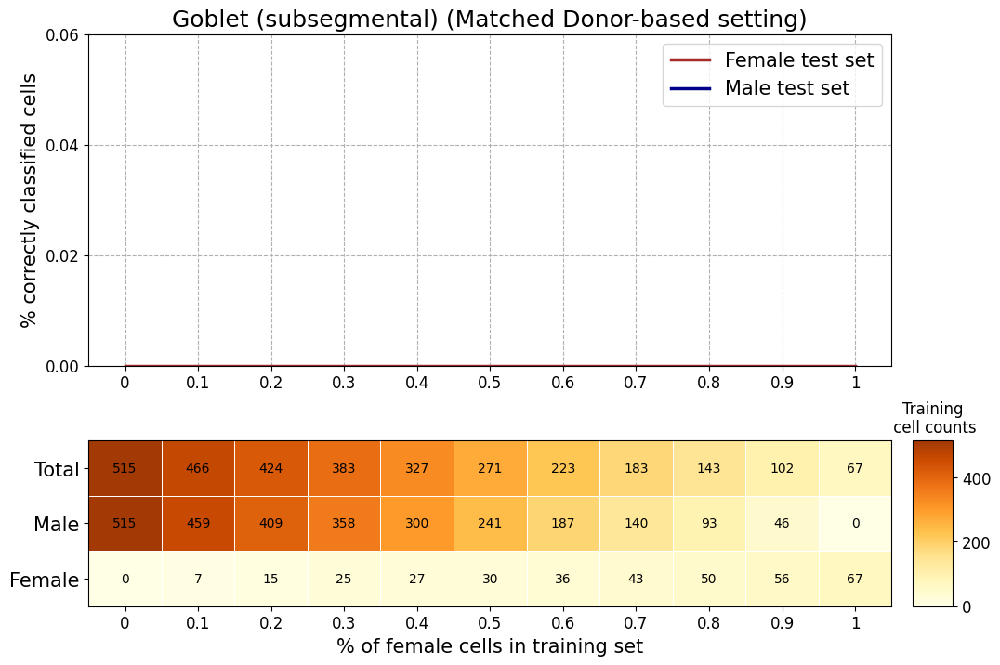

This cell type (Goblet (subsegmental)) contains NaN values in a test set. Skipping slope calculation.
Goblet (subsegmental) count in male test set: 0
Goblet (subsegmental) count in female test set: 0
ann_2


C:\Users\NORA\AppData\Local\Temp\ipykernel_5624\3163767391.py:25: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_df = pd.concat([results_df, temp_df], ignore_index=True)


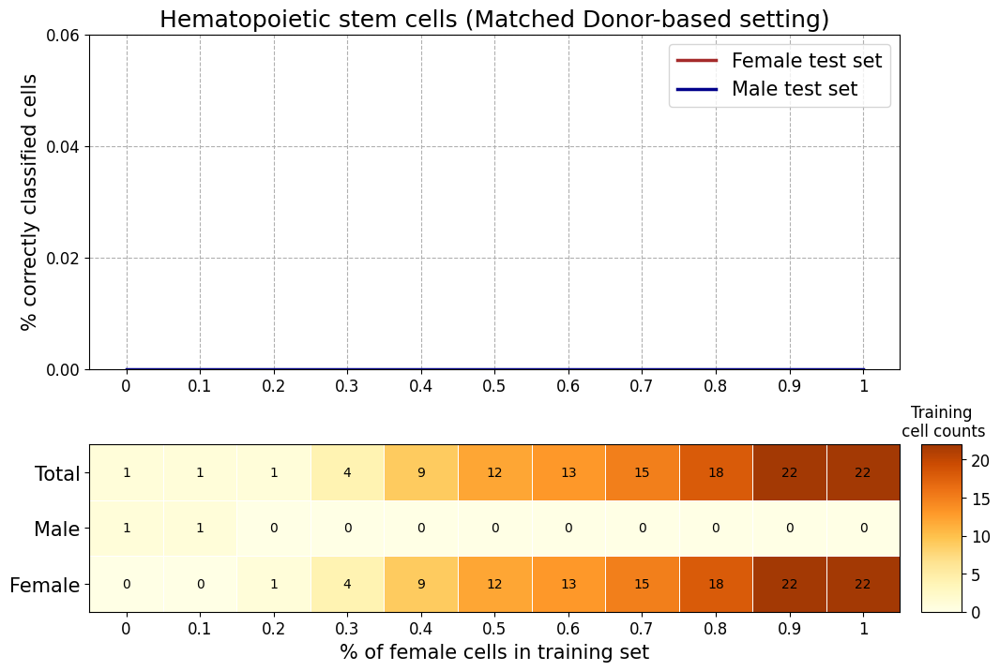

This cell type (Hematopoietic stem cells) contains NaN values in a test set. Skipping slope calculation.
Hematopoietic stem cells count in male test set: 1
Hematopoietic stem cells count in female test set: 0
ann_4


C:\Users\NORA\AppData\Local\Temp\ipykernel_5624\3163767391.py:25: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_df = pd.concat([results_df, temp_df], ignore_index=True)


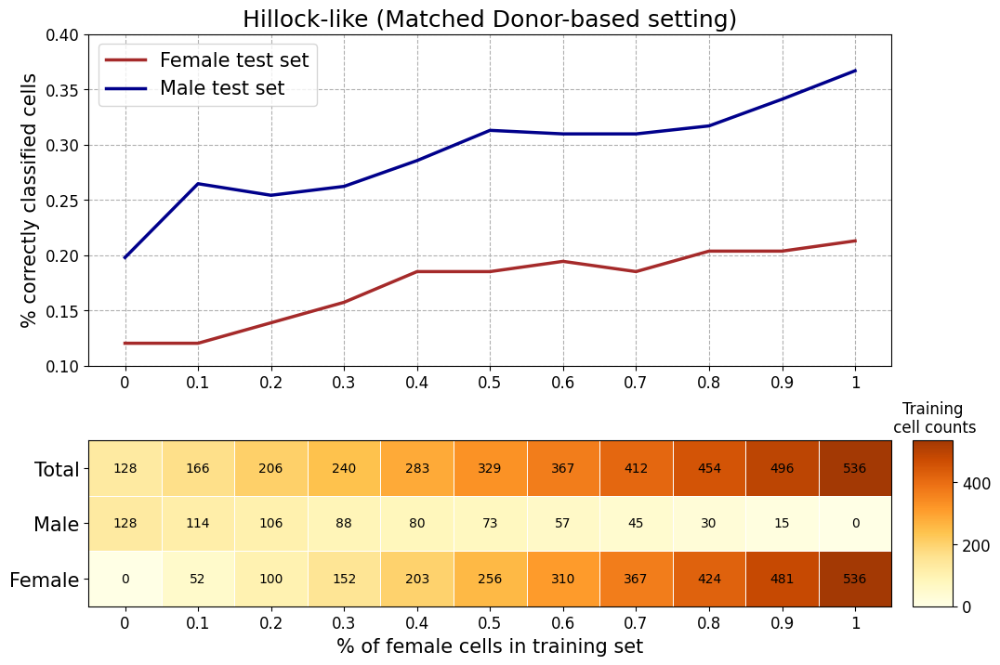

Hillock-like count in male test set: 1243
Hillock-like count in female test set: 108
ann_finest


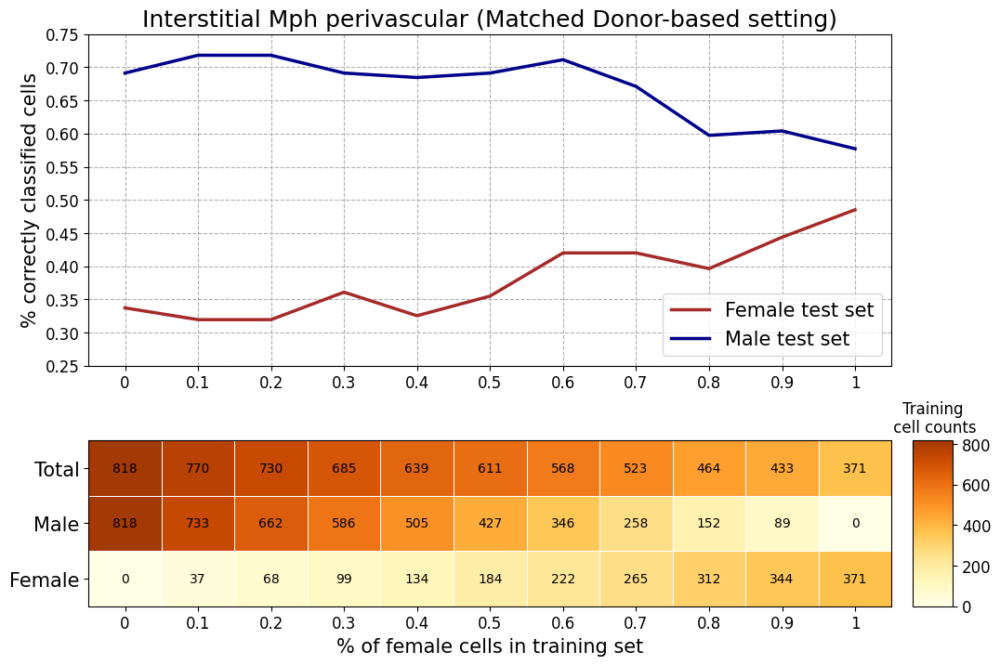

Interstitial Mph perivascular count in male test set: 149
Interstitial Mph perivascular count in female test set: 169
ann_4


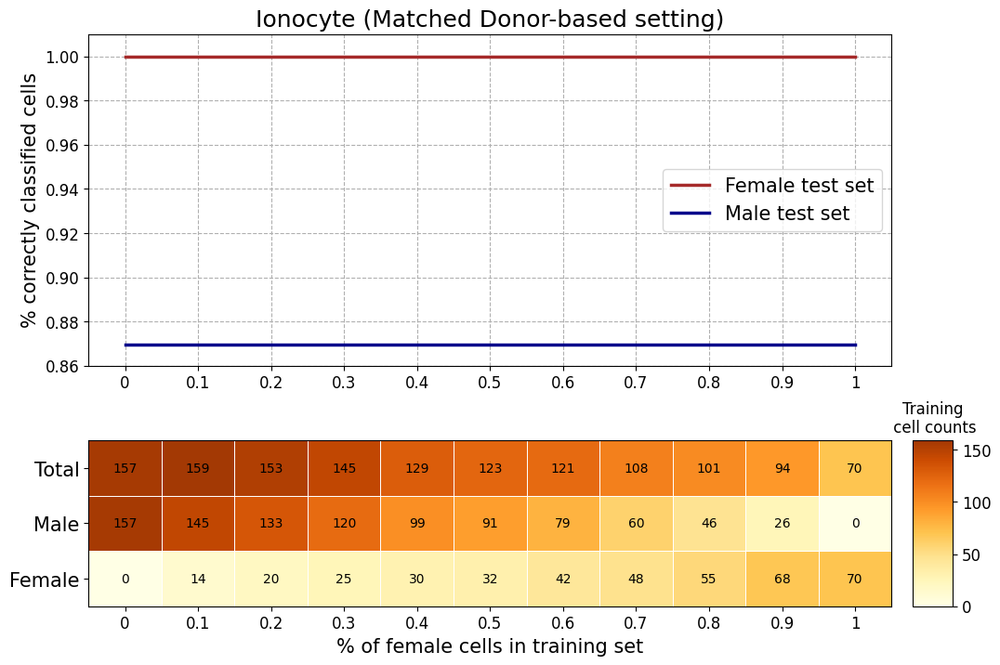

Ionocyte count in male test set: 23
Ionocyte count in female test set: 2
ann_3


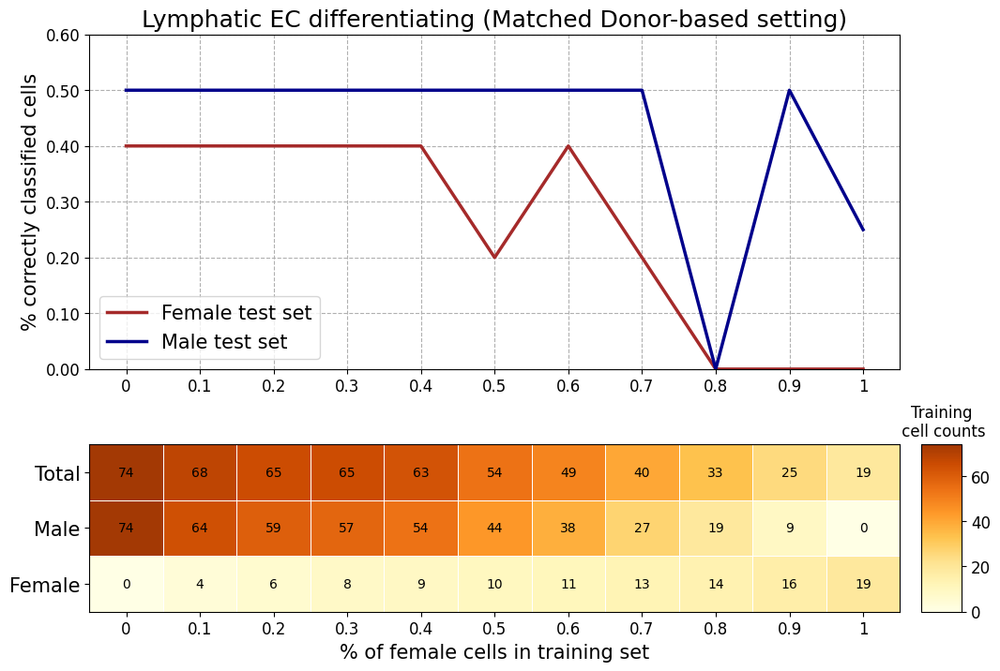

Lymphatic EC differentiating count in male test set: 4
Lymphatic EC differentiating count in female test set: 5
ann_3


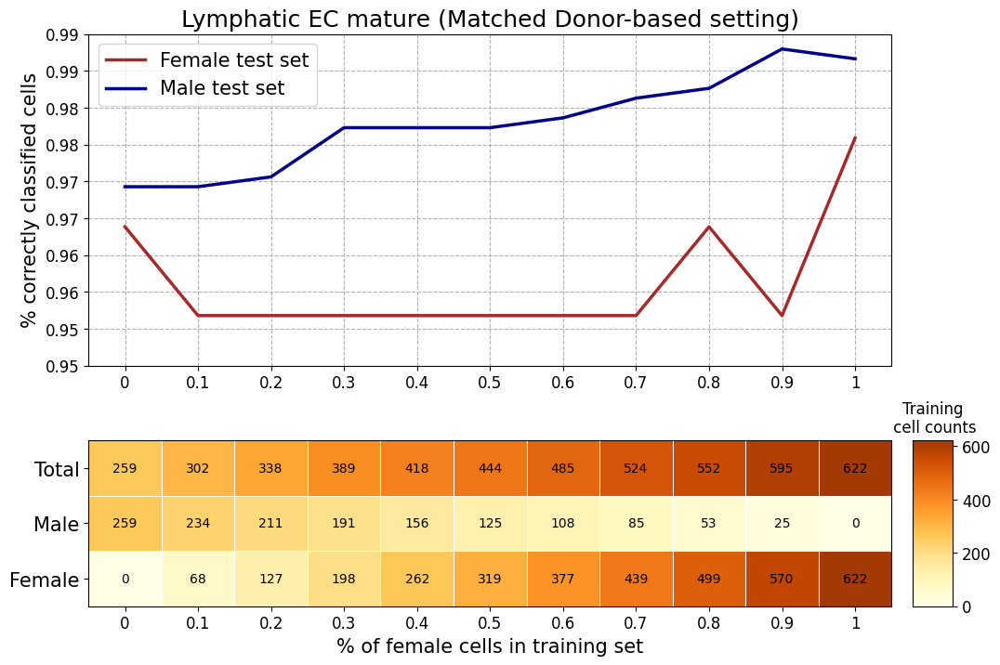

Lymphatic EC mature count in male test set: 749
Lymphatic EC mature count in female test set: 83
ann_3


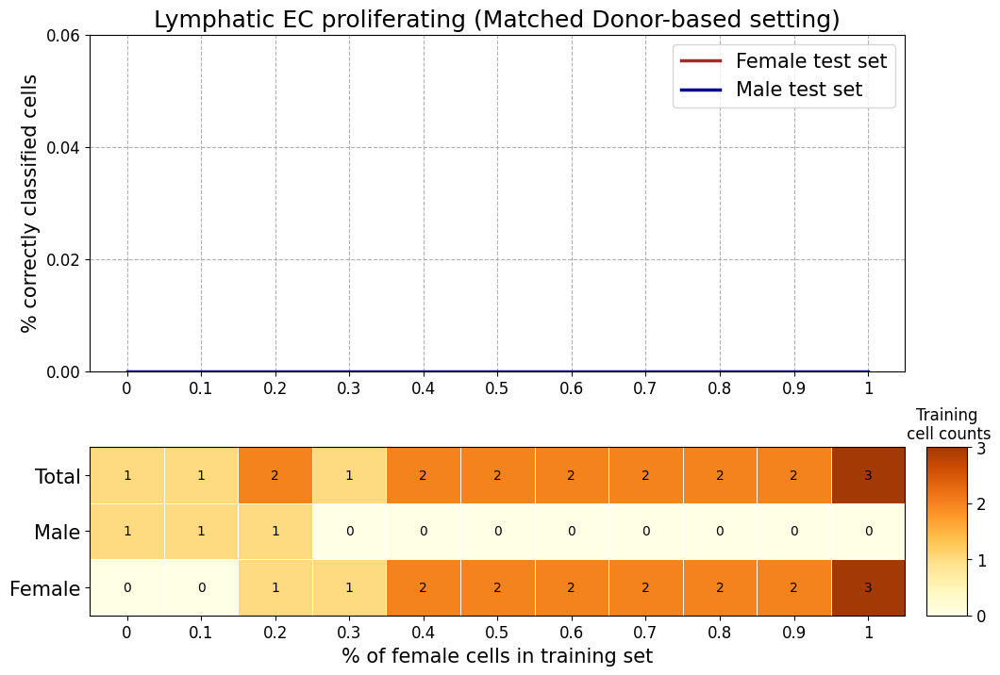

This cell type (Lymphatic EC proliferating) contains NaN values in a test set. Skipping slope calculation.
Lymphatic EC proliferating count in male test set: 12
Lymphatic EC proliferating count in female test set: 0
ann_3


C:\Users\NORA\AppData\Local\Temp\ipykernel_5624\3163767391.py:25: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_df = pd.concat([results_df, temp_df], ignore_index=True)


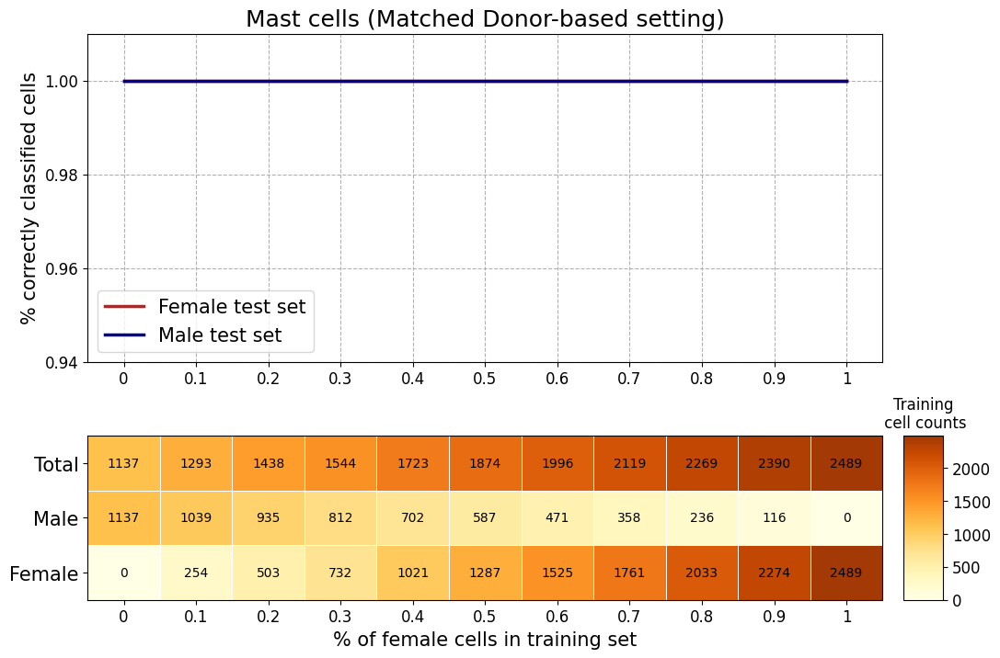

Mast cells count in male test set: 41
Mast cells count in female test set: 78
ann_2


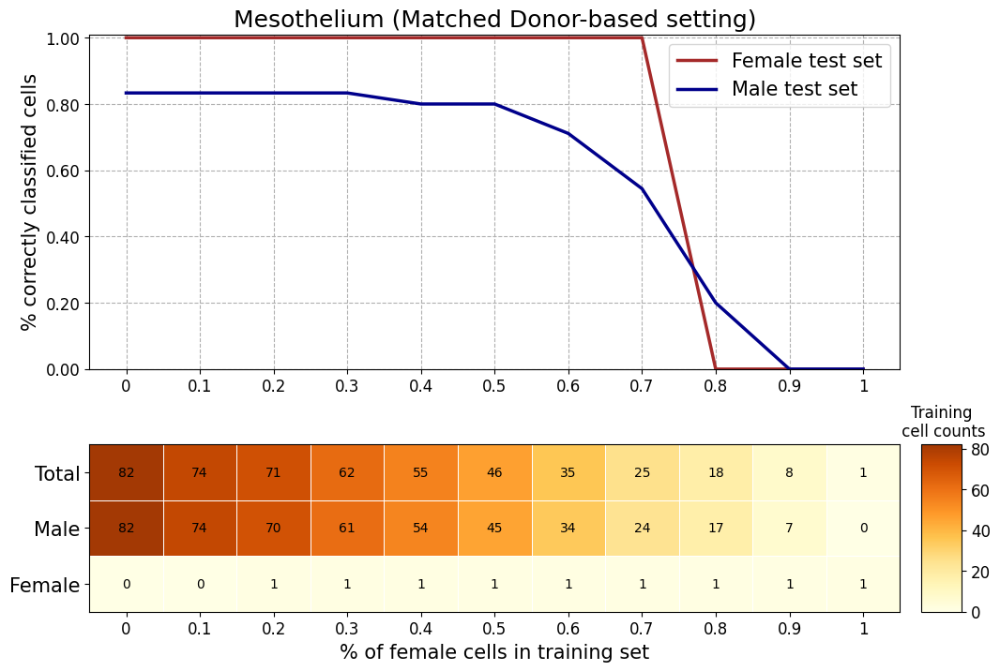

Mesothelium count in male test set: 90
Mesothelium count in female test set: 1
ann_4


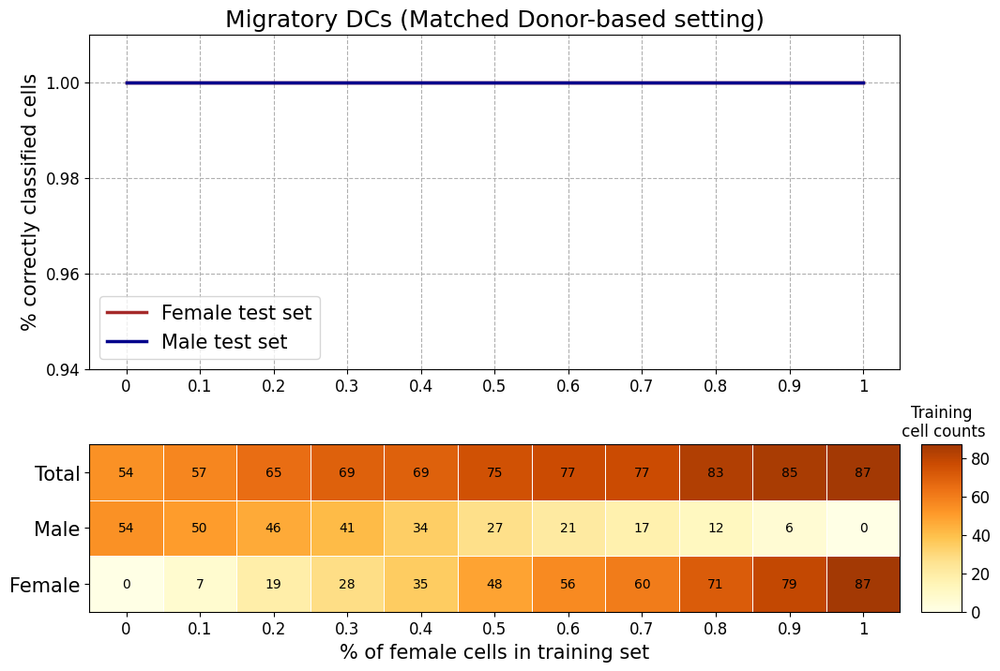

Migratory DCs count in male test set: 2
Migratory DCs count in female test set: 3
ann_finest


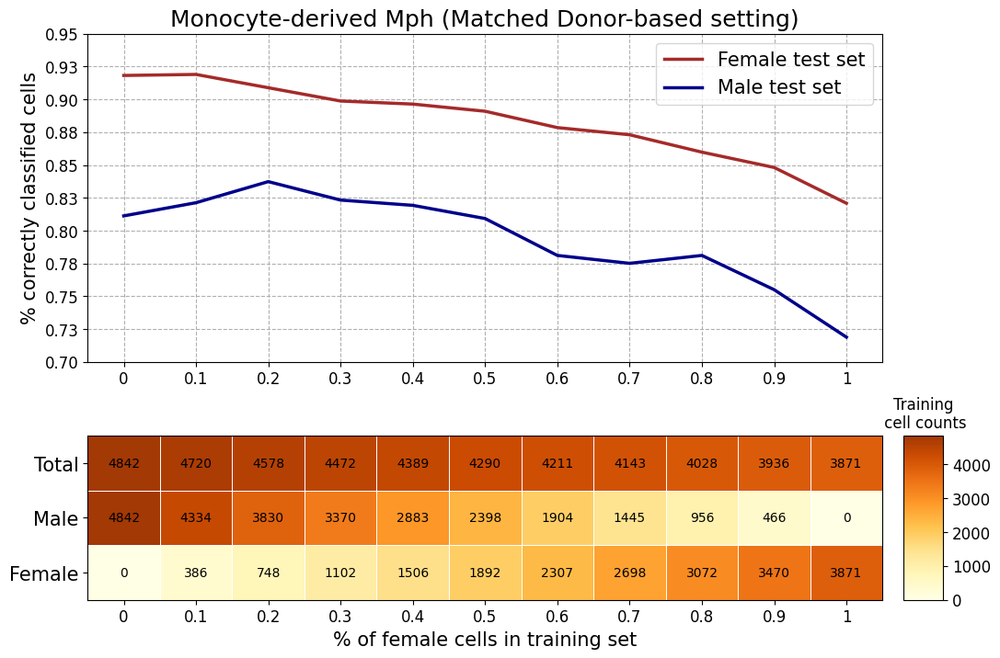

Monocyte-derived Mph count in male test set: 498
Monocyte-derived Mph count in female test set: 1284
ann_finest


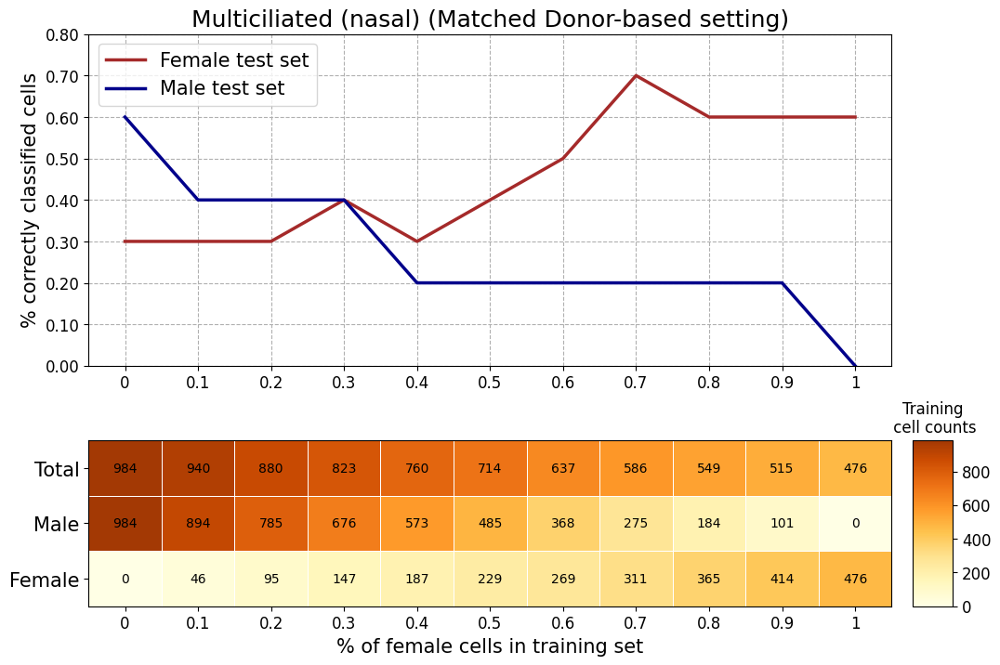

Multiciliated (nasal) count in male test set: 5
Multiciliated (nasal) count in female test set: 10
ann_finest


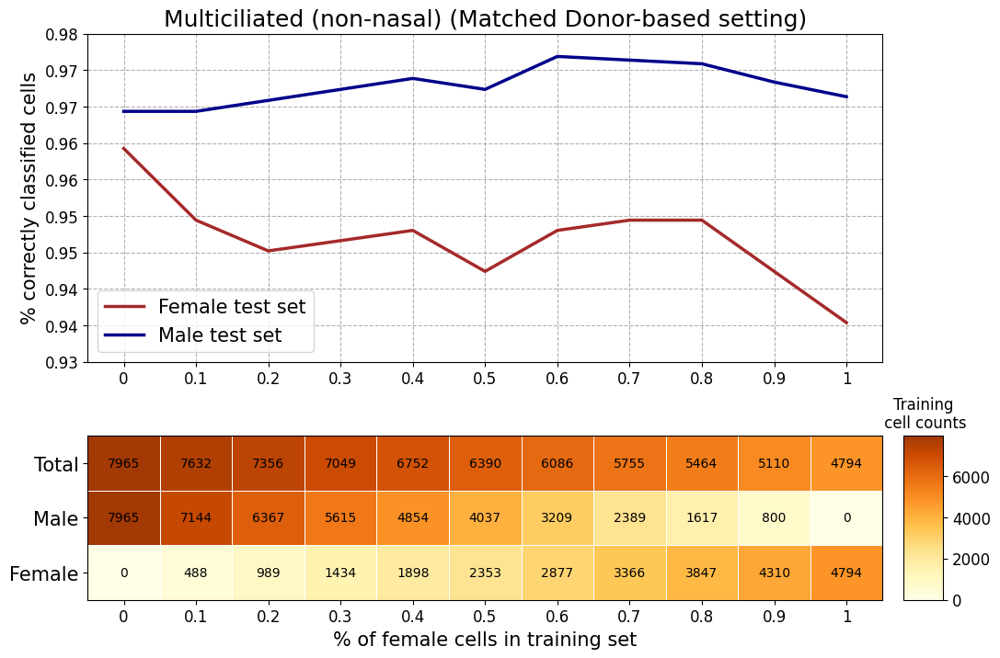

Multiciliated (non-nasal) count in male test set: 1992
Multiciliated (non-nasal) count in female test set: 712
ann_3


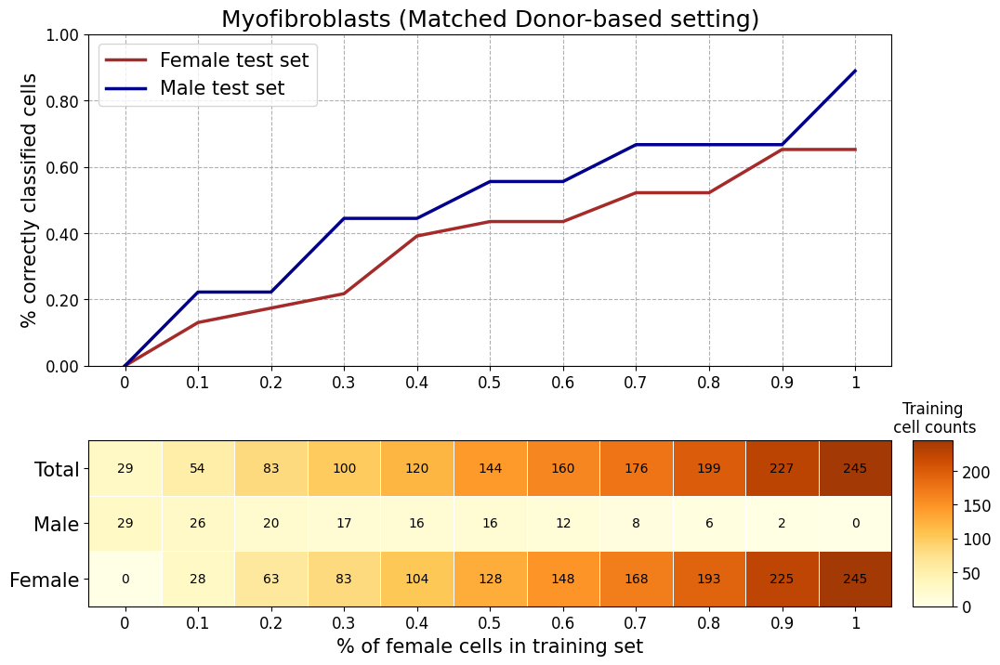

Myofibroblasts count in male test set: 9
Myofibroblasts count in female test set: 23
ann_4


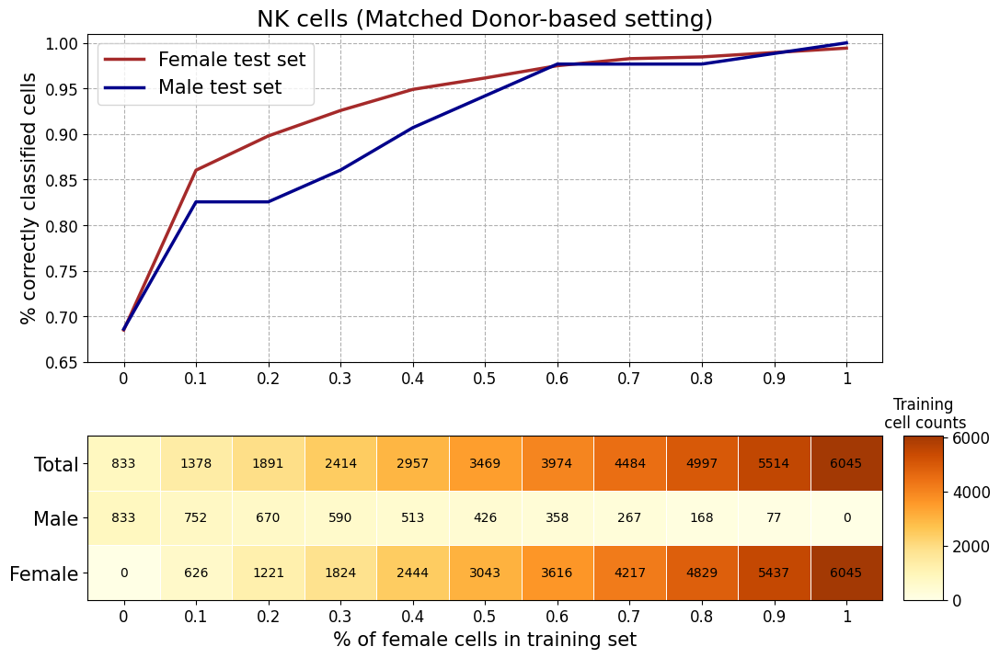

NK cells count in male test set: 86
NK cells count in female test set: 1038
ann_4


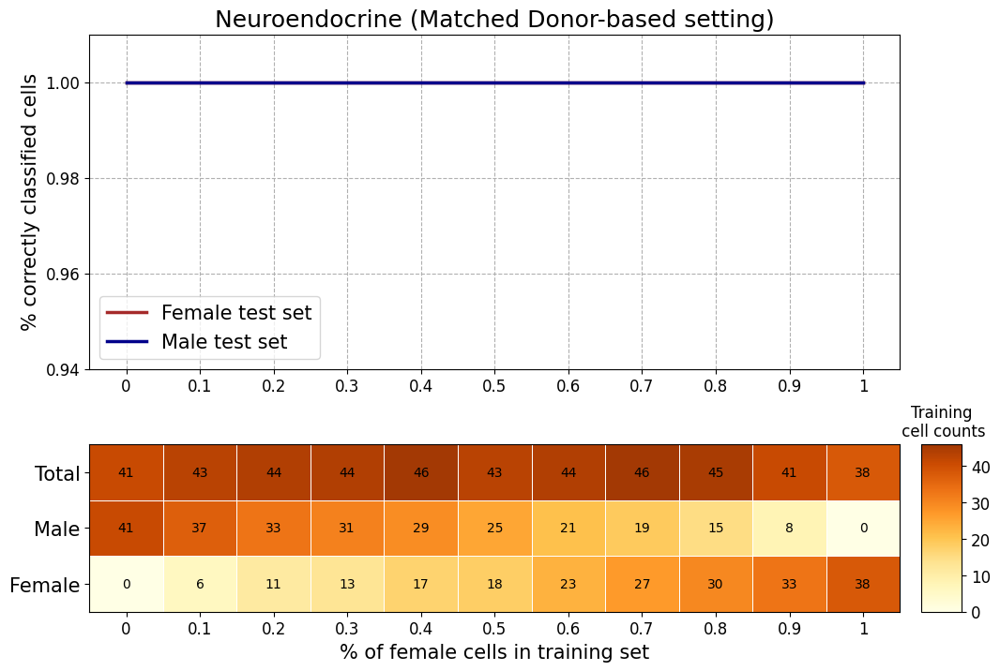

Neuroendocrine count in male test set: 9
Neuroendocrine count in female test set: 4
ann_4


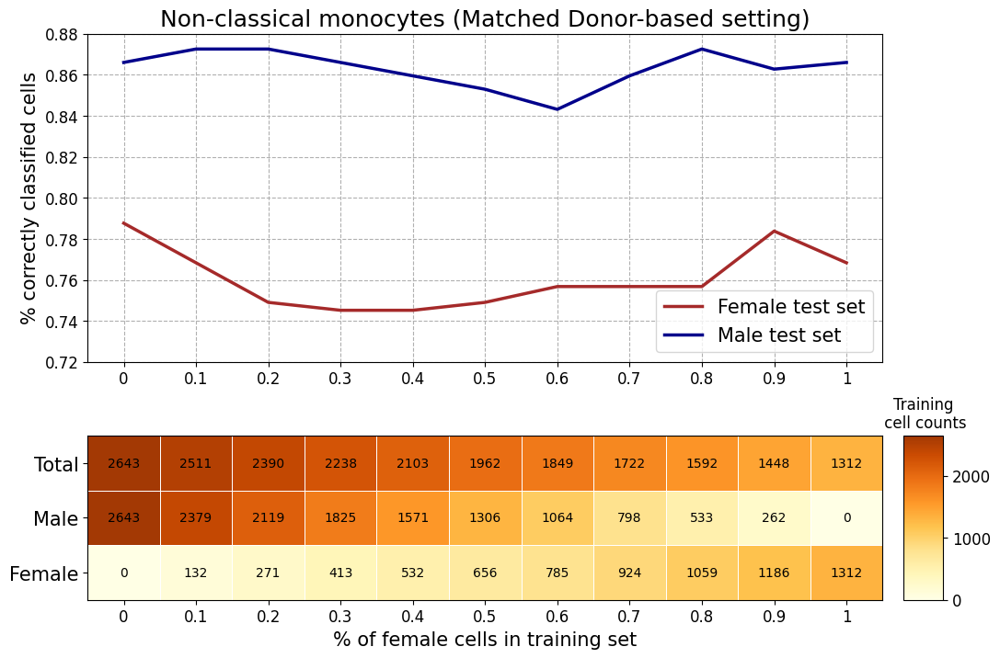

Non-classical monocytes count in male test set: 306
Non-classical monocytes count in female test set: 259
ann_4


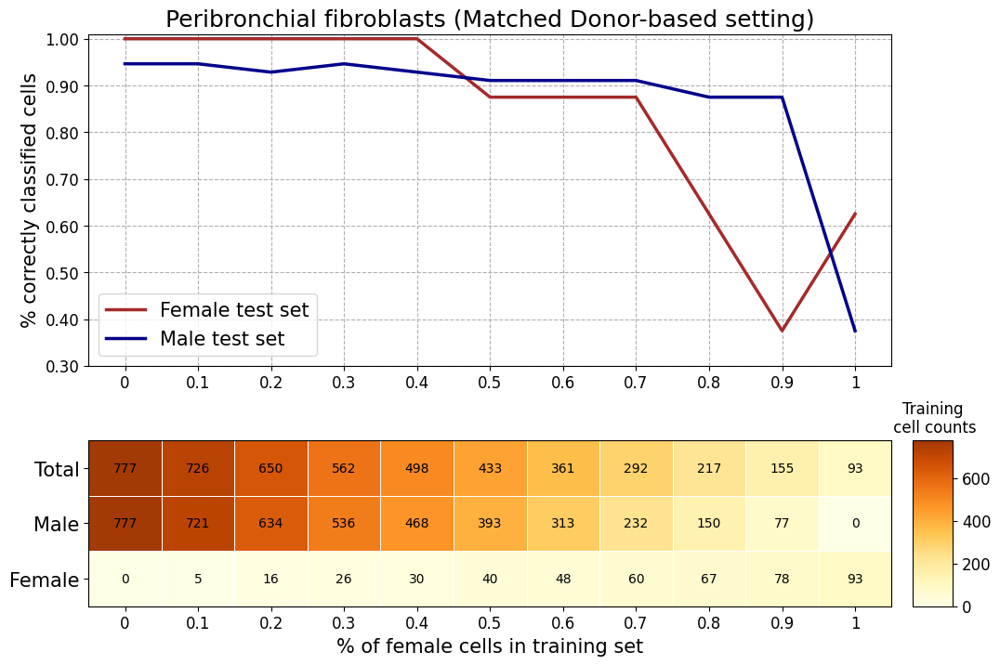

Peribronchial fibroblasts count in male test set: 56
Peribronchial fibroblasts count in female test set: 8
ann_4


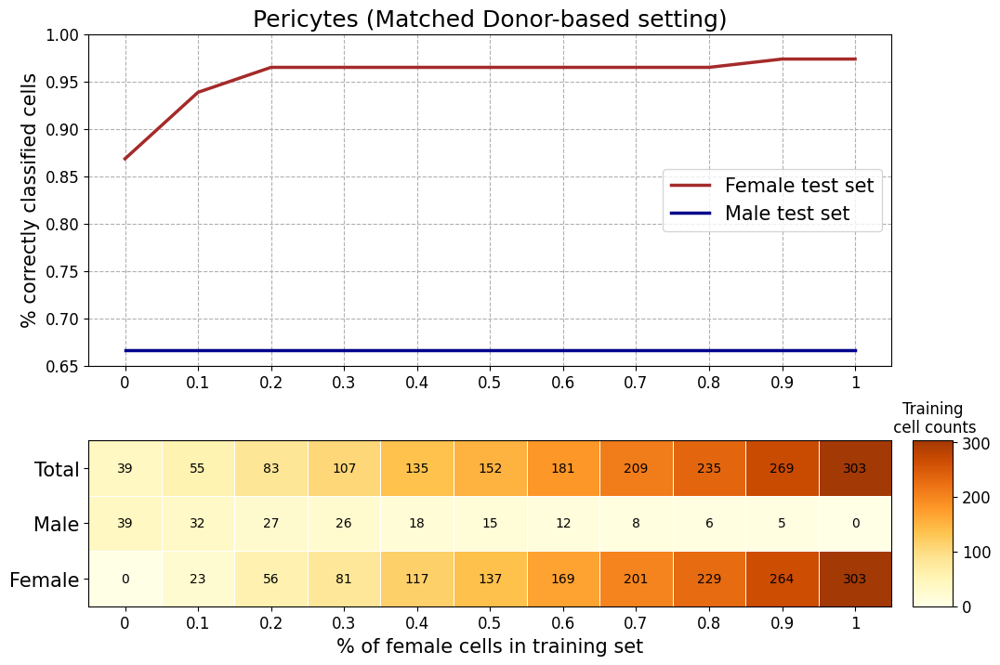

Pericytes count in male test set: 3
Pericytes count in female test set: 114
ann_4


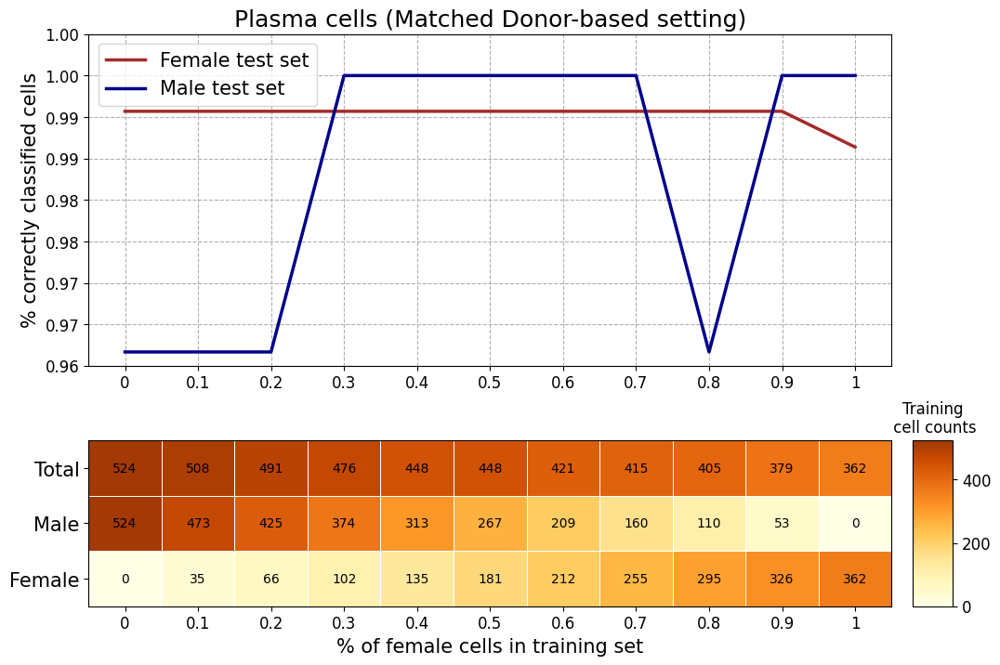

Plasma cells count in male test set: 30
Plasma cells count in female test set: 232
ann_4


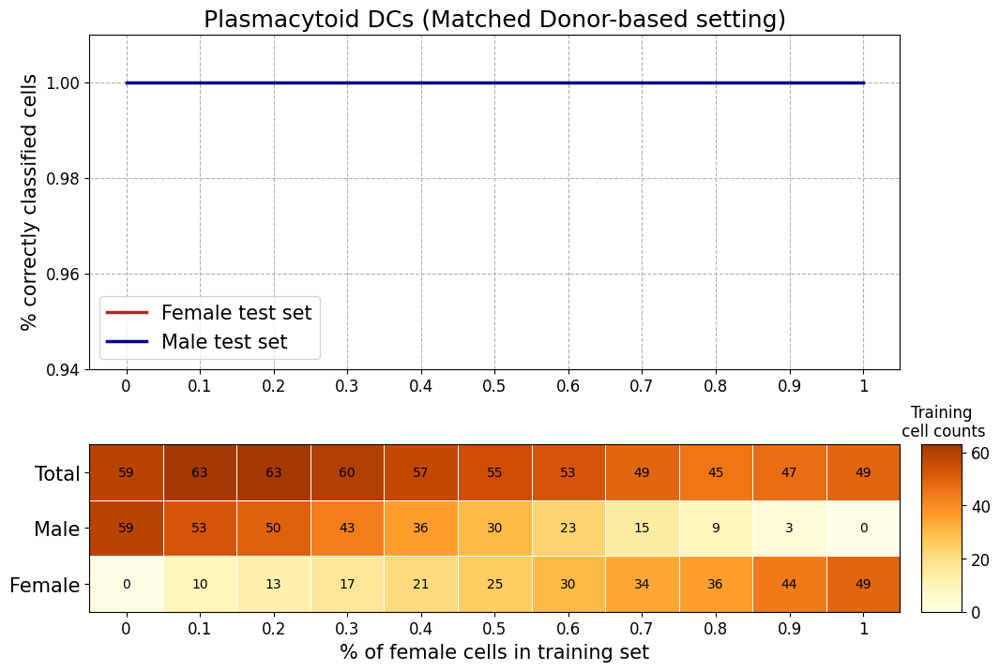

This cell type (Plasmacytoid DCs) contains NaN values in a test set. Skipping slope calculation.
Plasmacytoid DCs count in male test set: 3
Plasmacytoid DCs count in female test set: 0
ann_3


C:\Users\NORA\AppData\Local\Temp\ipykernel_5624\3163767391.py:25: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_df = pd.concat([results_df, temp_df], ignore_index=True)


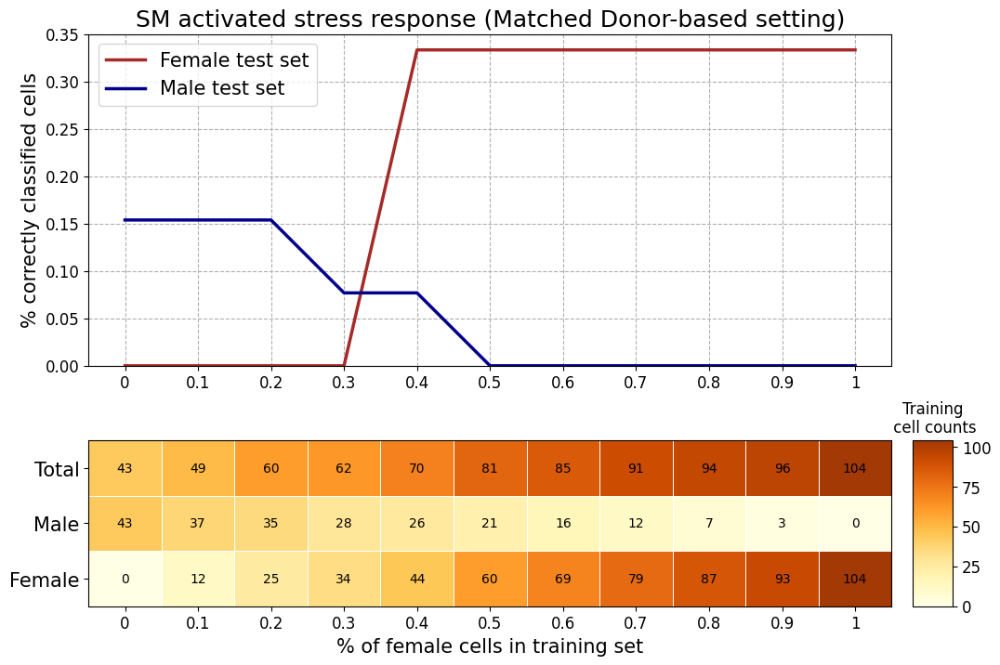

SM activated stress response count in male test set: 13
SM activated stress response count in female test set: 3
ann_4


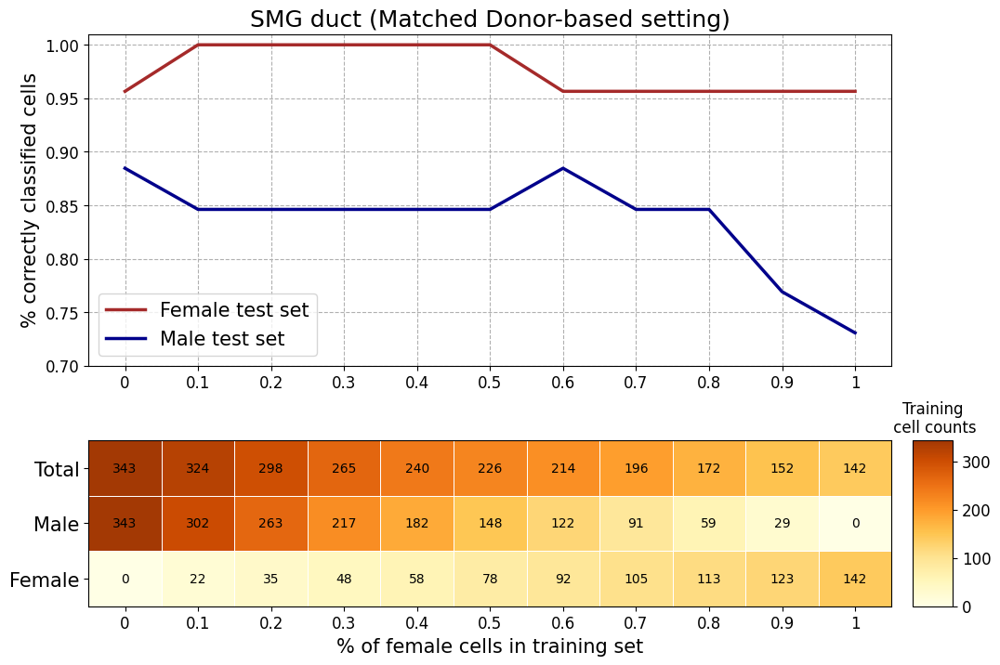

SMG duct count in male test set: 26
SMG duct count in female test set: 23
ann_4


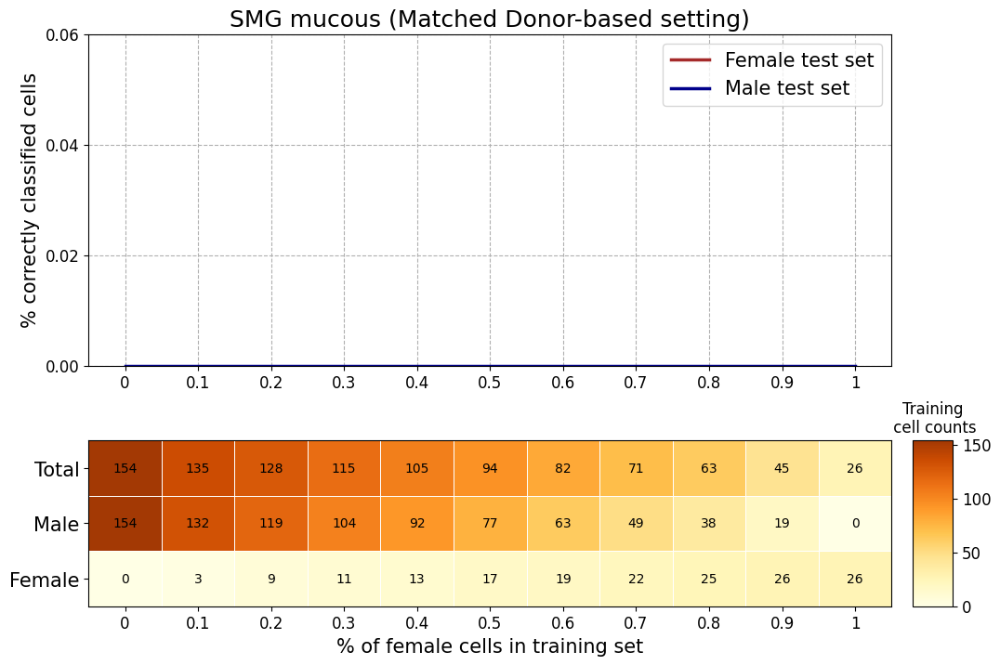

This cell type (SMG mucous) contains NaN values in a test set. Skipping slope calculation.
SMG mucous count in male test set: 1
SMG mucous count in female test set: 0
ann_finest


C:\Users\NORA\AppData\Local\Temp\ipykernel_5624\3163767391.py:25: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_df = pd.concat([results_df, temp_df], ignore_index=True)


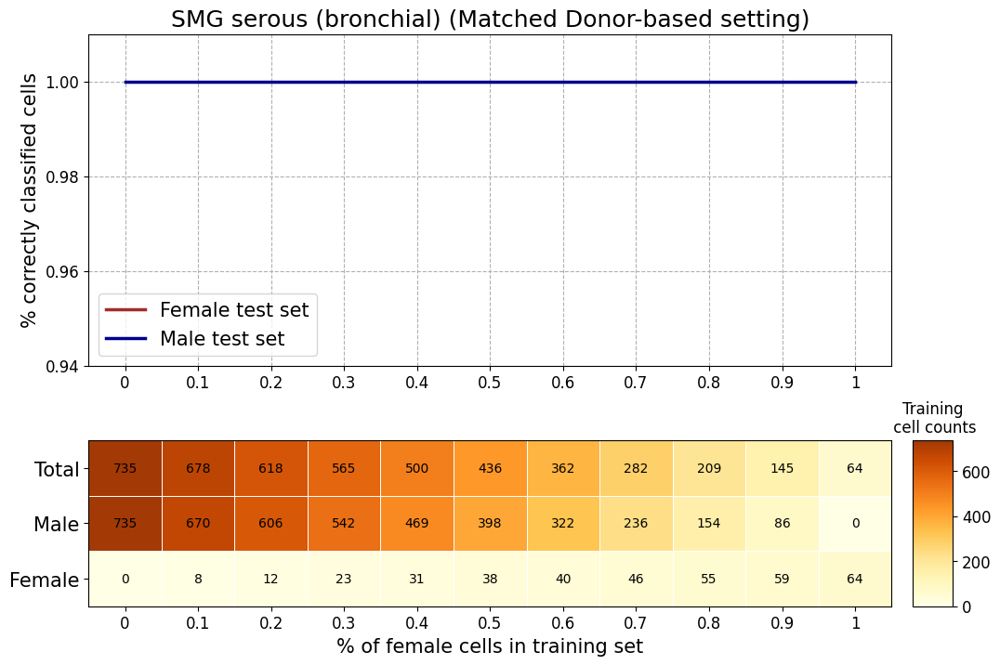

This cell type (SMG serous (bronchial)) contains NaN values in a test set. Skipping slope calculation.
SMG serous (bronchial) count in male test set: 15
SMG serous (bronchial) count in female test set: 0
ann_finest


C:\Users\NORA\AppData\Local\Temp\ipykernel_5624\3163767391.py:25: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_df = pd.concat([results_df, temp_df], ignore_index=True)


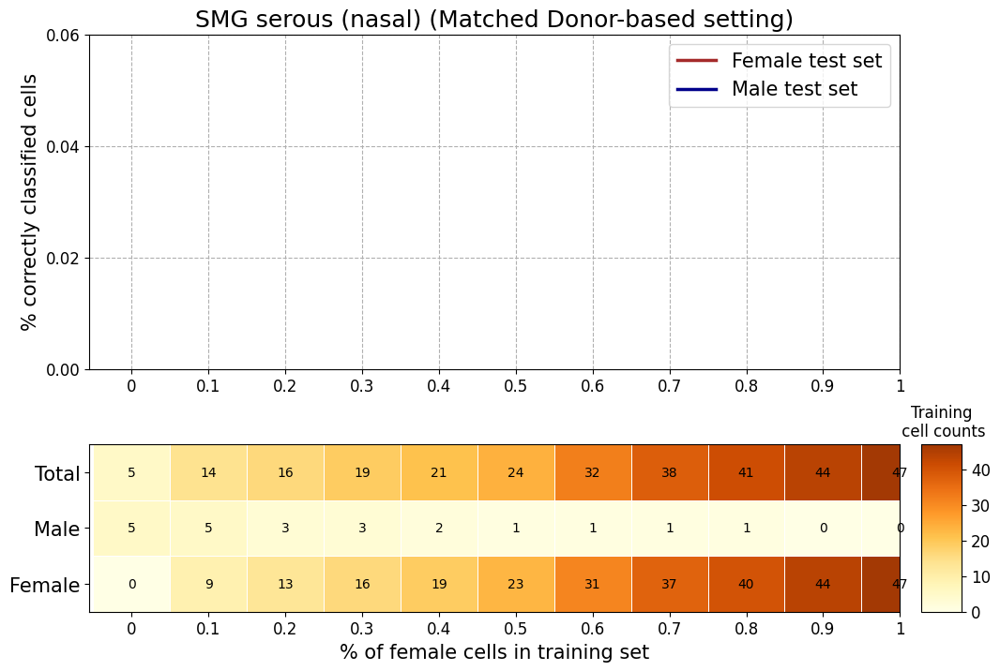

This cell type (SMG serous (nasal)) contains NaN values in a test set. Skipping slope calculation.
This cell type (SMG serous (nasal)) contains NaN values in a test set. Skipping slope calculation.
SMG serous (nasal) count in male test set: 0
SMG serous (nasal) count in female test set: 0
ann_2


C:\Users\NORA\AppData\Local\Temp\ipykernel_5624\3163767391.py:25: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_df = pd.concat([results_df, temp_df], ignore_index=True)


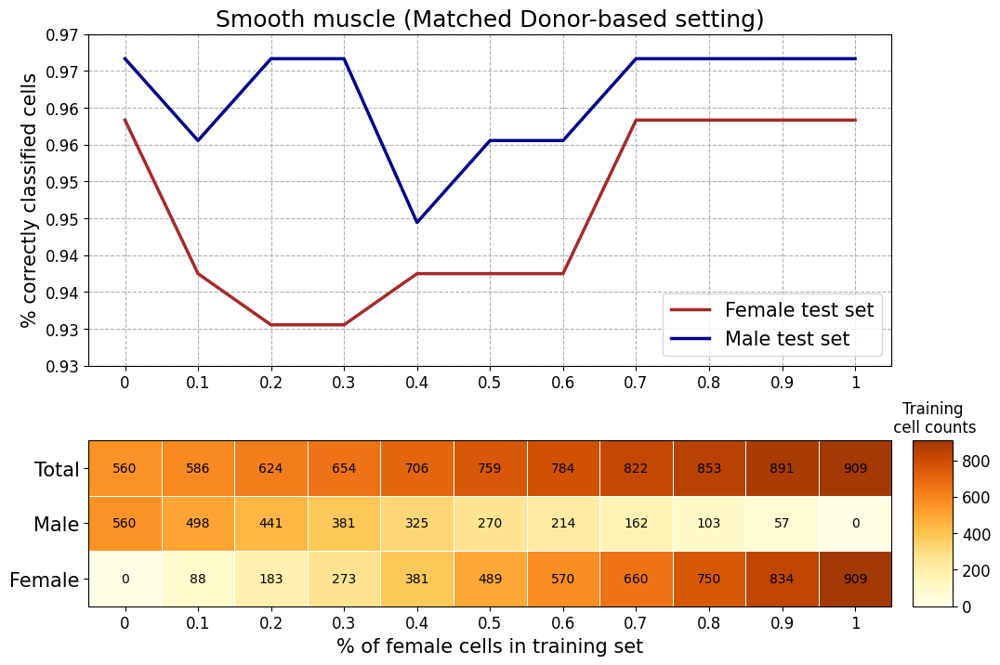

Smooth muscle count in male test set: 90
Smooth muscle count in female test set: 144
ann_3


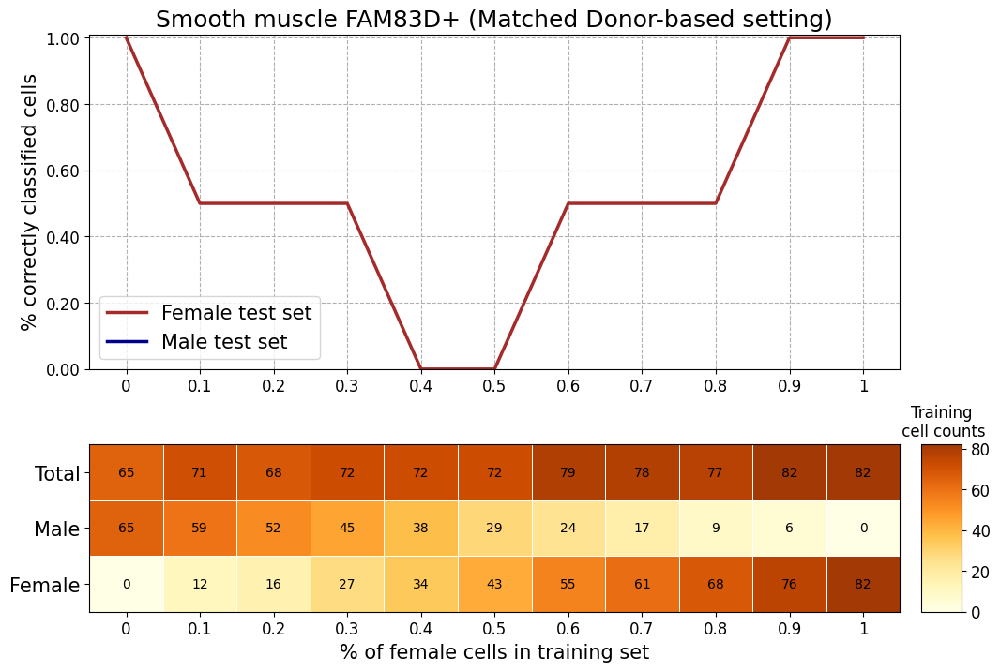

This cell type (Smooth muscle FAM83D+) contains NaN values in a test set. Skipping slope calculation.
Smooth muscle FAM83D+ count in male test set: 0
Smooth muscle FAM83D+ count in female test set: 0
ann_4


C:\Users\NORA\AppData\Local\Temp\ipykernel_5624\3163767391.py:25: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_df = pd.concat([results_df, temp_df], ignore_index=True)


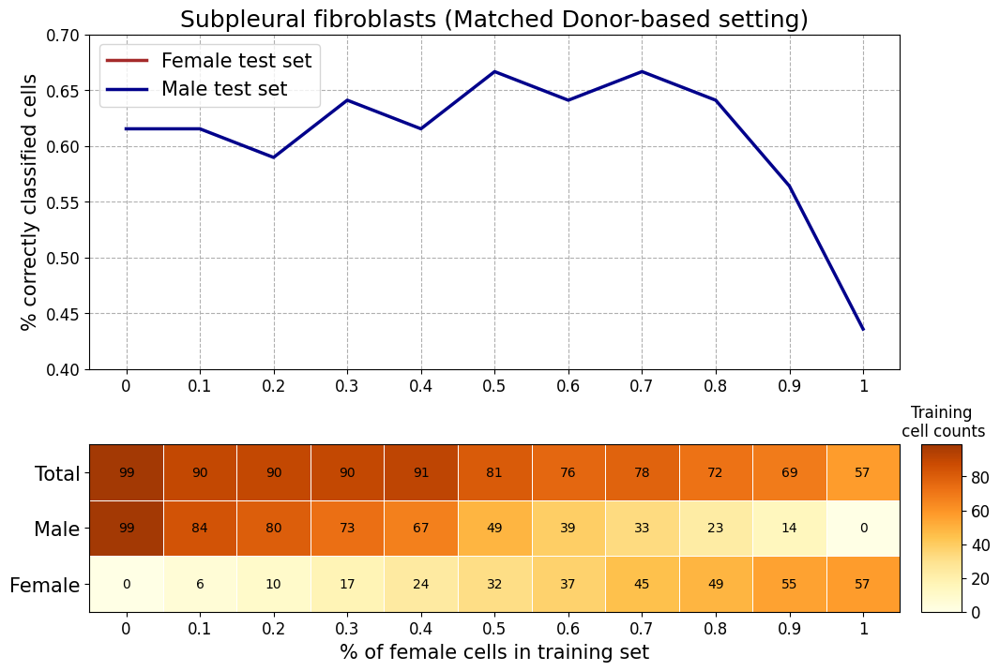

This cell type (Subpleural fibroblasts) contains NaN values in a test set. Skipping slope calculation.
Subpleural fibroblasts count in male test set: 39
Subpleural fibroblasts count in female test set: 0
ann_4


C:\Users\NORA\AppData\Local\Temp\ipykernel_5624\3163767391.py:25: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_df = pd.concat([results_df, temp_df], ignore_index=True)


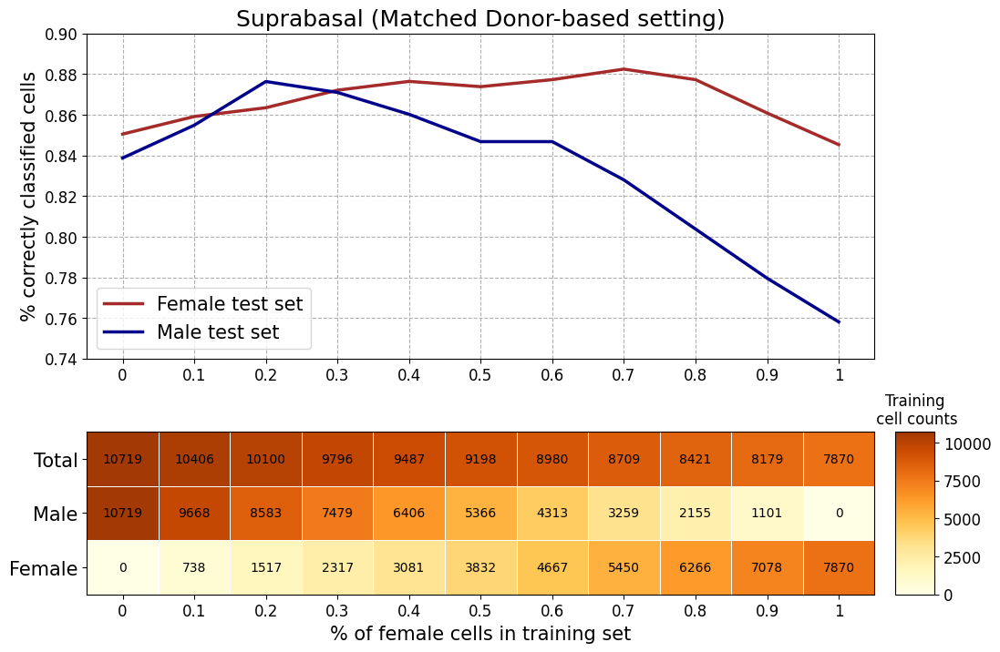

Suprabasal count in male test set: 372
Suprabasal count in female test set: 1157
ann_4


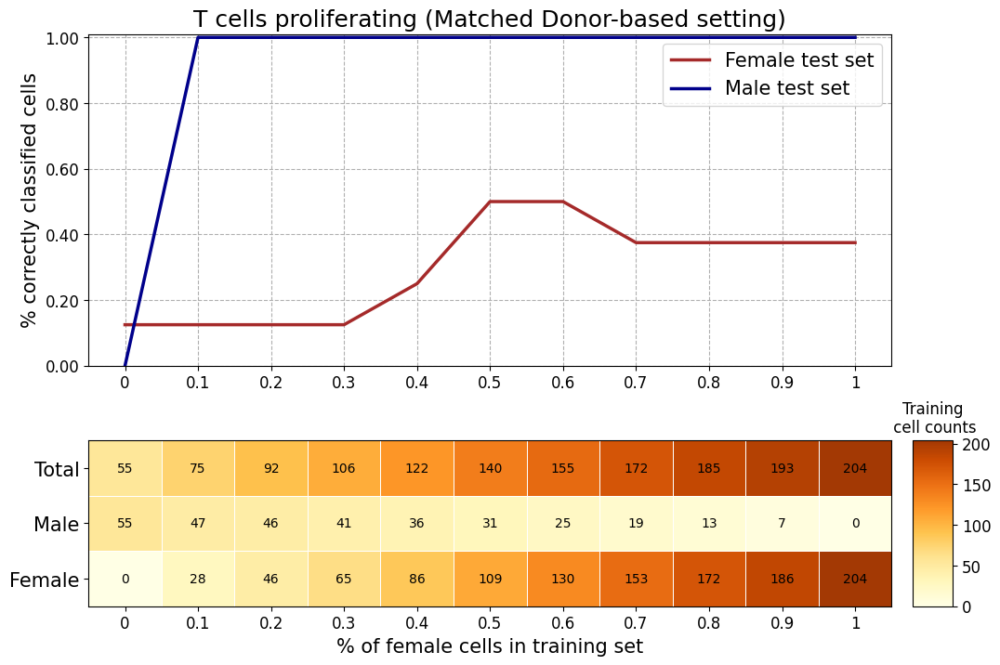

T cells proliferating count in male test set: 1
T cells proliferating count in female test set: 8
ann_4


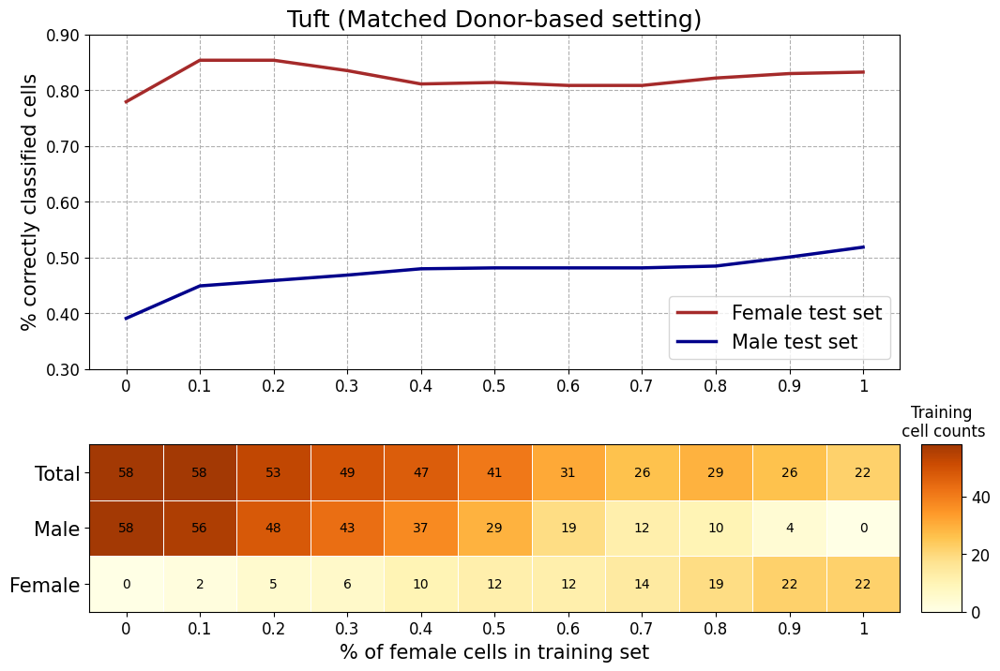

Tuft count in male test set: 2
Tuft count in female test set: 2
ann_finest


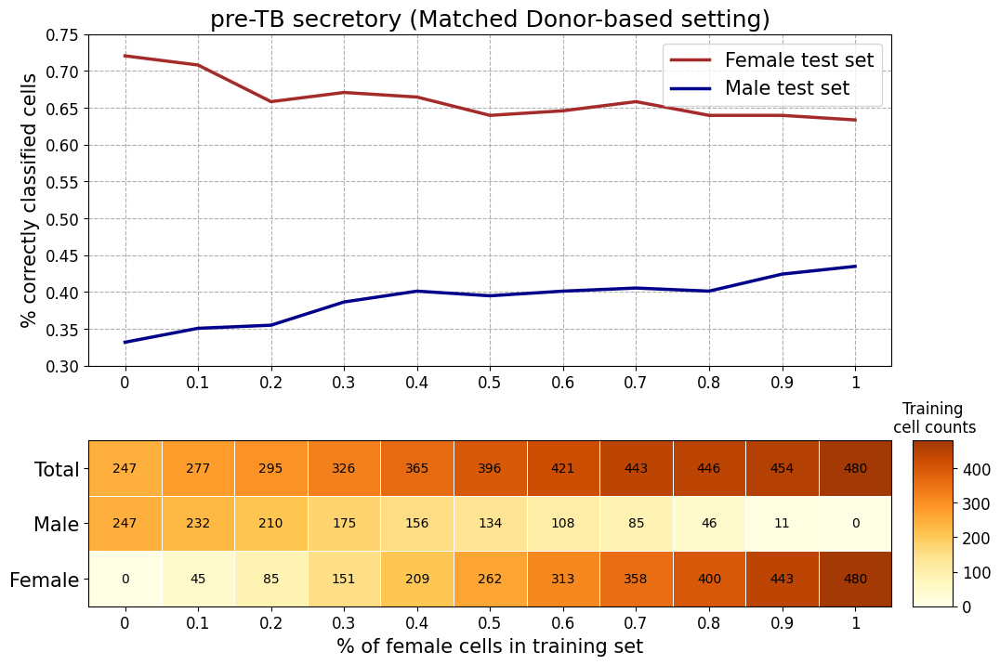

pre-TB secretory count in male test set: 476
pre-TB secretory count in female test set: 161


In [11]:
for cell_type in cell_names["ann_finest"]:
    ann_level = det_ann_level(cell_type, cell_names)
    male_lst, female_lst = gather_cms(general_path, 'seed42', ann_level, cell_names, cell_type)
    slopes, opposing_tuple, max_diff = plot_combined_classif(cell_type, cell_type, female_lst, male_lst, training_counts_dict[ann_level])

    if cell_type in male_test_counts_dict[ann_level]:
        male_count = male_test_counts_dict[ann_level][cell_type]
    else:
        male_count = 0
    print(f'{cell_type} count in male test set: {male_count}')
    if cell_type in female_test_counts_dict[ann_level]:
        female_count = female_test_counts_dict[ann_level][cell_type]
    else:
        female_count = 0
    print(f'{cell_type} count in female test set: {female_count}')

    temp_df = pd.DataFrame({
        'Cell type': [cell_type],
        'Slope test': [opposing_tuple[0]],
        'Flip test': [opposing_tuple[1]],
        'Maximum performance difference': [max_diff],
        'Slope on female set': slopes[0],
        'Slope on male set': slopes[1]
    })
    results_df = pd.concat([results_df, temp_df], ignore_index=True)


### Final table

In [12]:
results_df

,Cell type,Slope test,Flip test,Maximum performance difference,Slope on female set,Slope on male set
0,AT0,False,False,0.307985,0.123890,0.078830
1,AT1,False,True,0.037103,0.080103,0.057399
2,AT2,False,True,0.007772,0.001314,0.010025
3,AT2 proliferating,False,False,0.532468,0.111570,0.482517
4,Adventitial fibroblasts,True,False,0.279097,0.069142,-0.021356
...,...,...,...,...,...,...
56,Subpleural fibroblasts,None,False,-inf,NaN,-0.079254
57,Suprabasal,True,False,0.087225,0.004007,-0.092864
58,T cells proliferating,False,True,0.875000,0.340909,0.454545
59,Tuft,False,False,0.404612,0.001692,0.086356


In [13]:
# consider 'distinct behavior' if both slope test and flip test are fulfilled:
results_df['Classification trend'] = results_df.apply(
    lambda row: 'Distinct' if row['Slope test'] and row['Flip test'] else 'Non-distinct',
    axis=1
)
results_df

,Cell type,Slope test,Flip test,Maximum performance difference,Slope on female set,Slope on male set,Classification trend
0,AT0,False,False,0.307985,0.123890,0.078830,Non-distinct
1,AT1,False,True,0.037103,0.080103,0.057399,Non-distinct
2,AT2,False,True,0.007772,0.001314,0.010025,Non-distinct
3,AT2 proliferating,False,False,0.532468,0.111570,0.482517,Non-distinct
4,Adventitial fibroblasts,True,False,0.279097,0.069142,-0.021356,Non-distinct
...,...,...,...,...,...,...,...
56,Subpleural fibroblasts,None,False,-inf,NaN,-0.079254,Non-distinct
57,Suprabasal,True,False,0.087225,0.004007,-0.092864,Non-distinct
58,T cells proliferating,False,True,0.875000,0.340909,0.454545,Non-distinct
59,Tuft,False,False,0.404612,0.001692,0.086356,Non-distinct


In [14]:
results_df[results_df["Classification trend"] == 'Distinct']

,Cell type,Slope test,Flip test,Maximum performance difference,Slope on female set,Slope on male set,Classification trend
17,DC1,True,True,0.750000,-0.181818,1.090909,Distinct
39,Multiciliated (nasal),True,True,0.600000,0.400000,-0.436364,Distinct
47,Plasma cells,True,True,0.029023,-0.001959,0.027273,Distinct
49,SM activated stress response,True,True,0.333333,0.424242,-0.188811,Distinct


#### Manually check inconclusive cell types:

ann_3


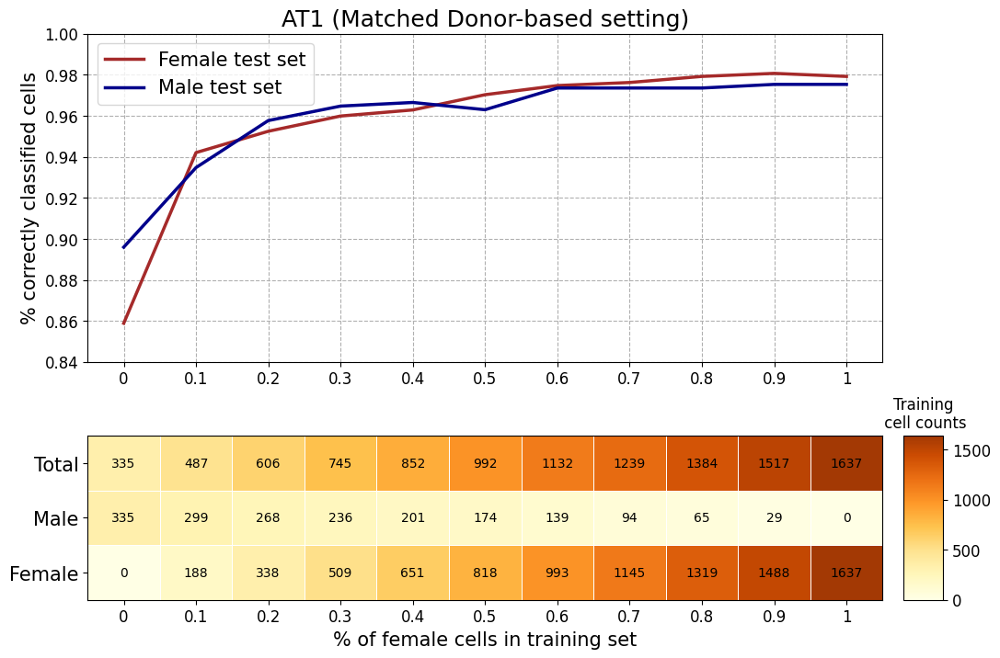

AT1: 0.08010266108334459, 0.057399390732724105
ann_3


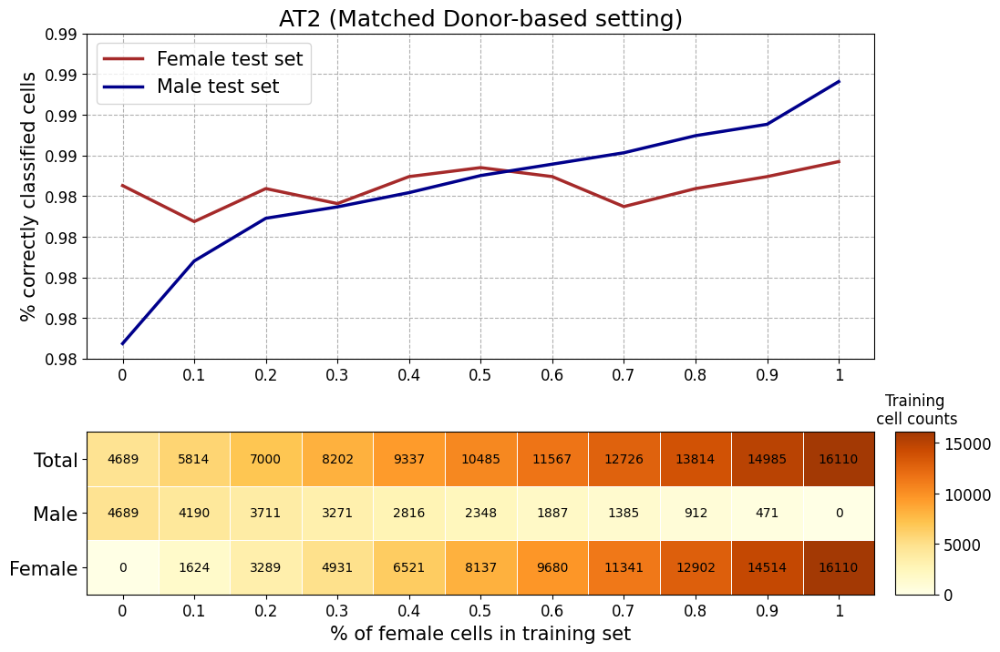

AT2: 0.0013140252078305073, 0.01002458379507564
ann_4


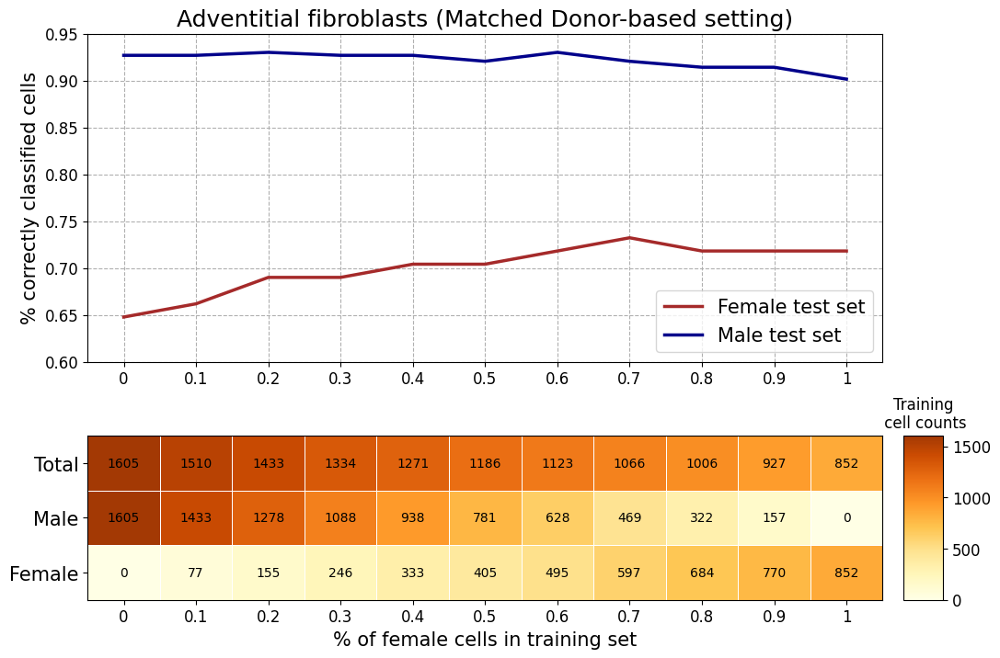

Adventitial fibroblasts: 0.06914212548015373, -0.021356421356421428
ann_4


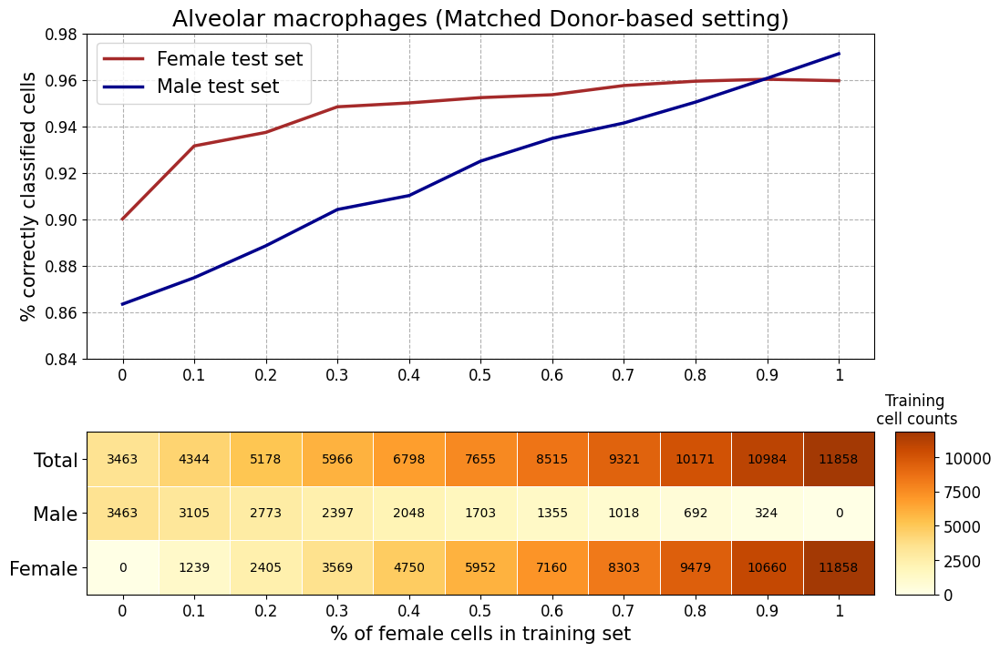

Alveolar macrophages: 0.04547345333535026, 0.10610365013774105
ann_4


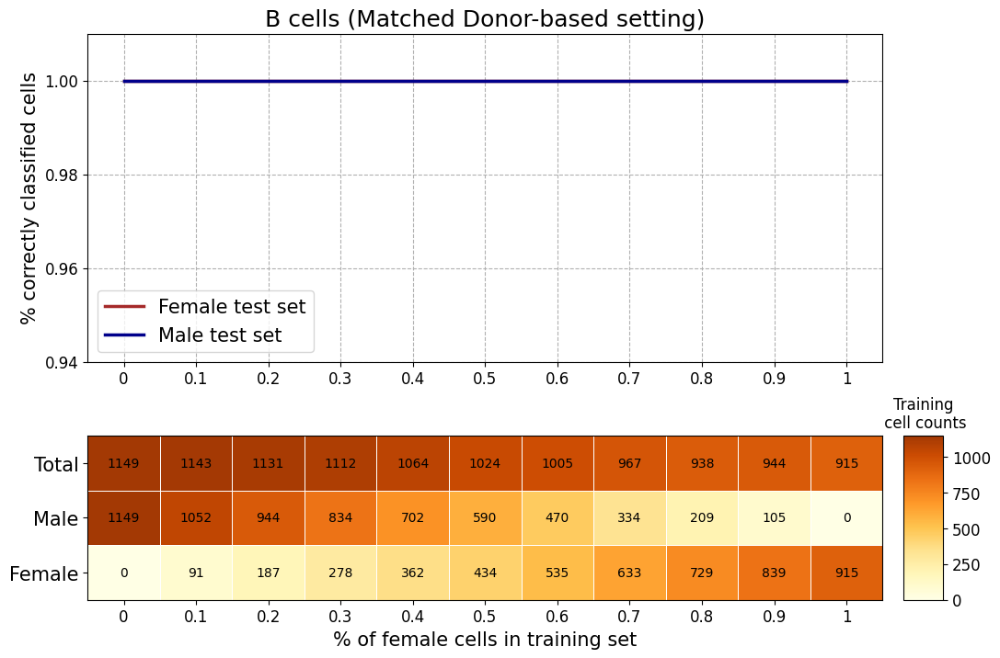

B cells: 0.0, 0.0
ann_4


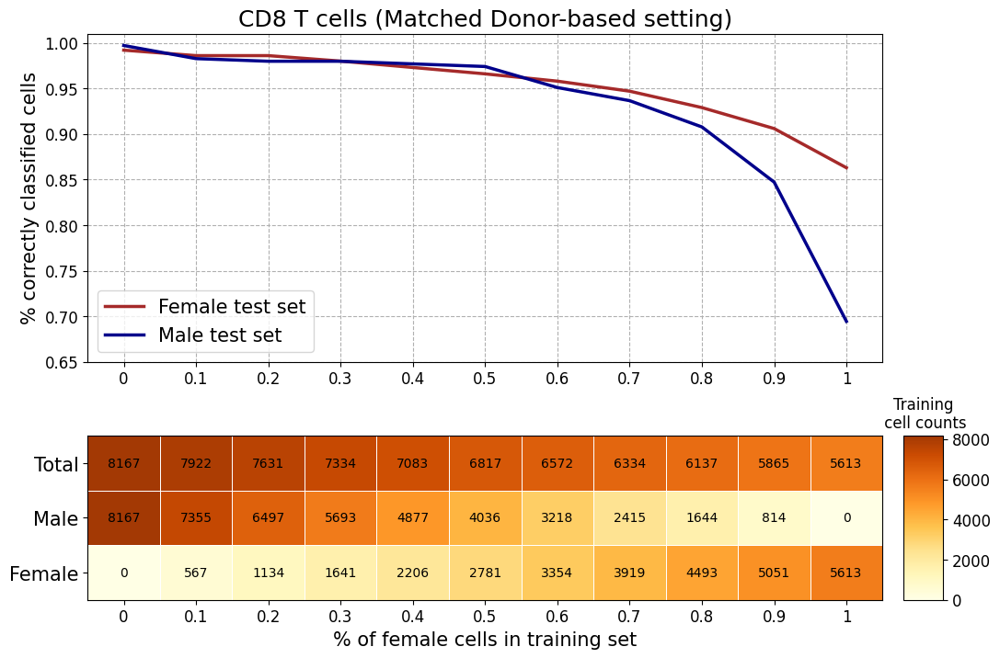

CD8 T cells: -0.11063636363636366, -0.21666230023578734
ann_4


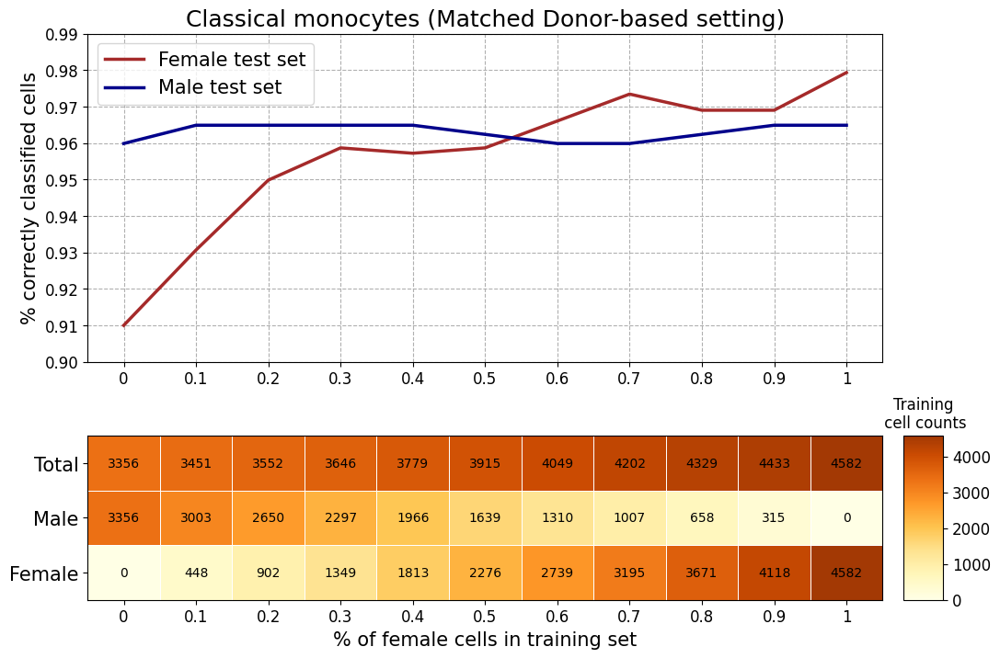

Classical monocytes: 0.0541700187717887, 0.00022784233310547652
ann_finest


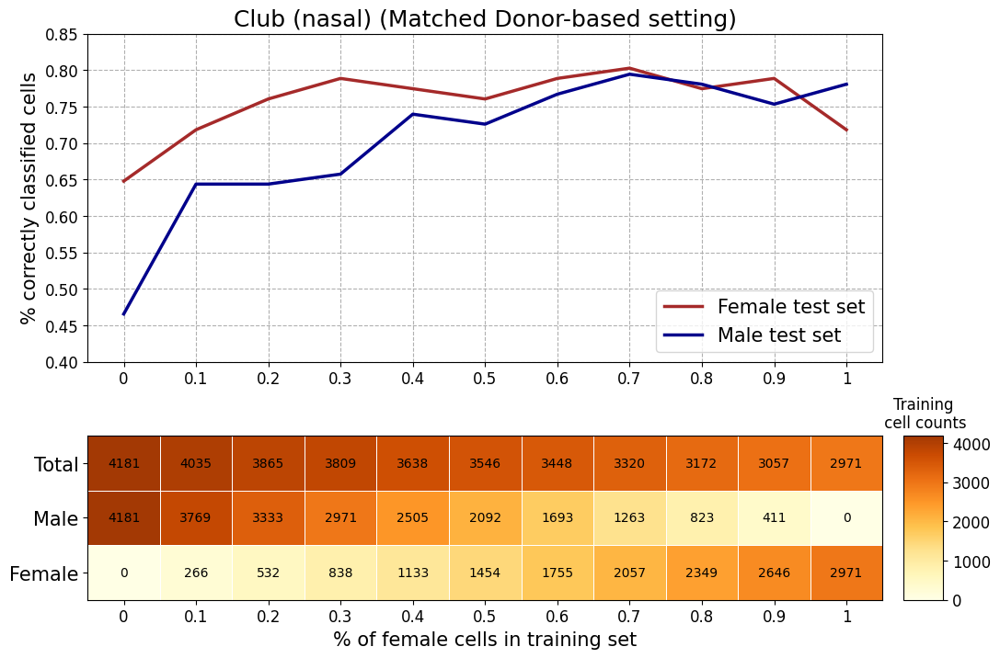

Club (nasal): 0.06530089628681178, 0.2478206724782068
ann_finest


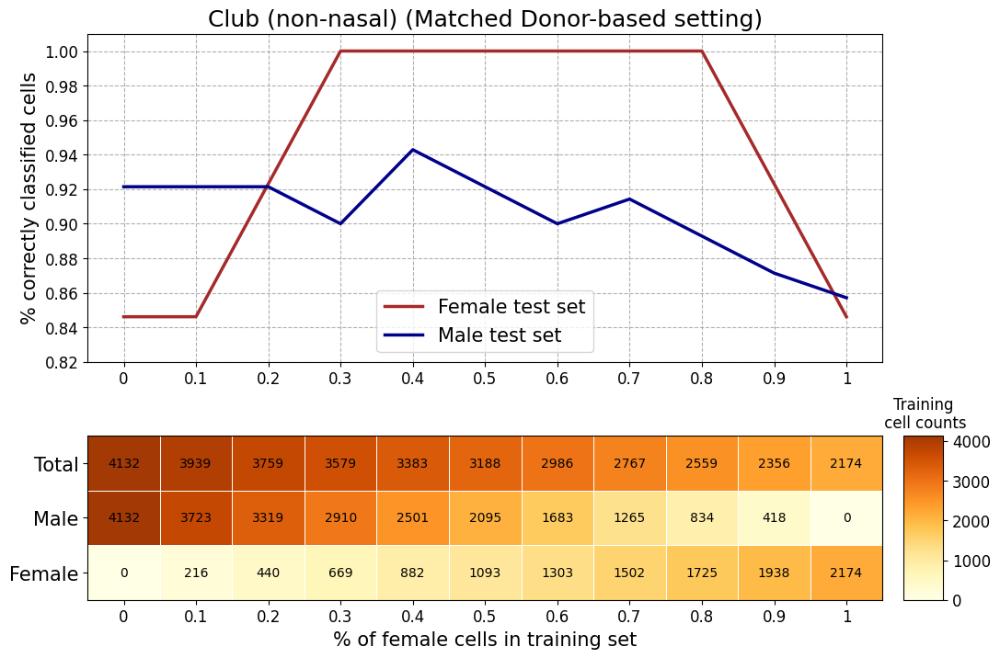

Club (non-nasal): 0.048951048951048966, -0.056493506493506464
ann_4


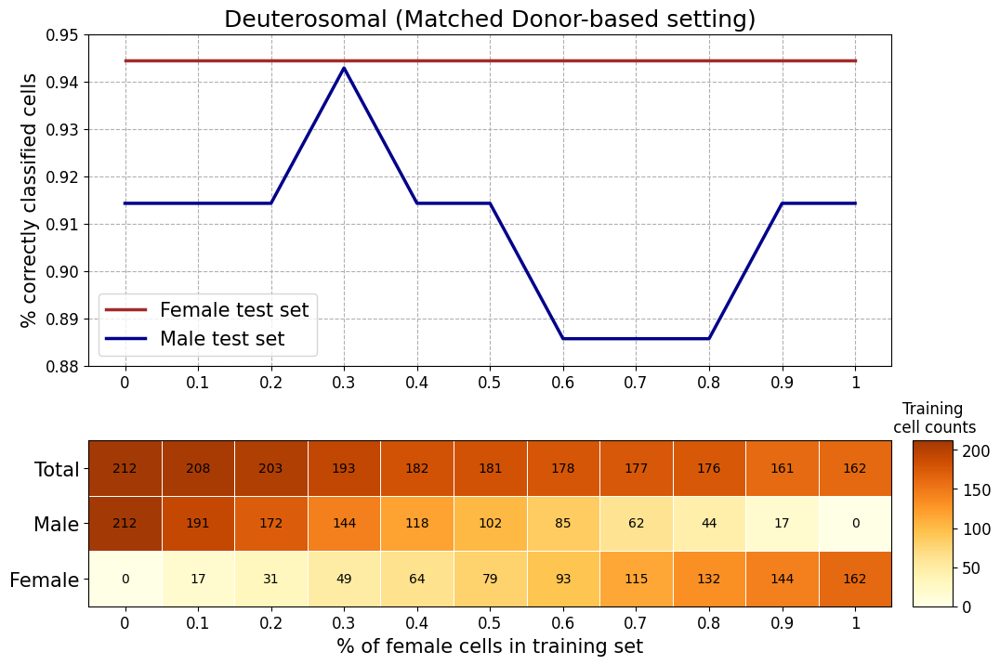

Deuterosomal: 6.849008143518759e-33, -0.020779220779220797
ann_finest


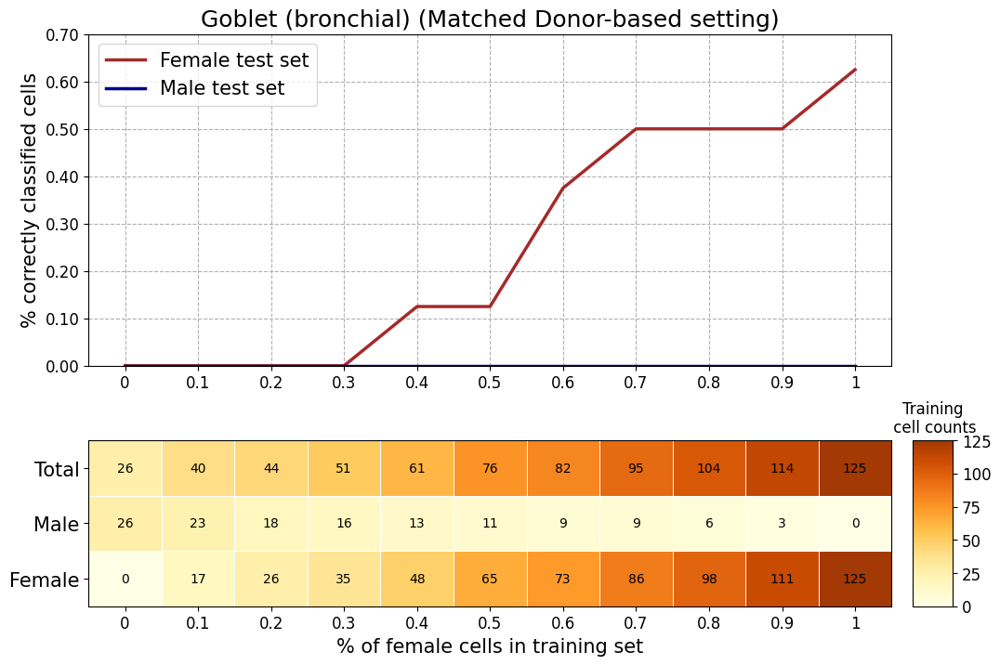

Goblet (bronchial): 0.715909090909091, 0.0
ann_finest


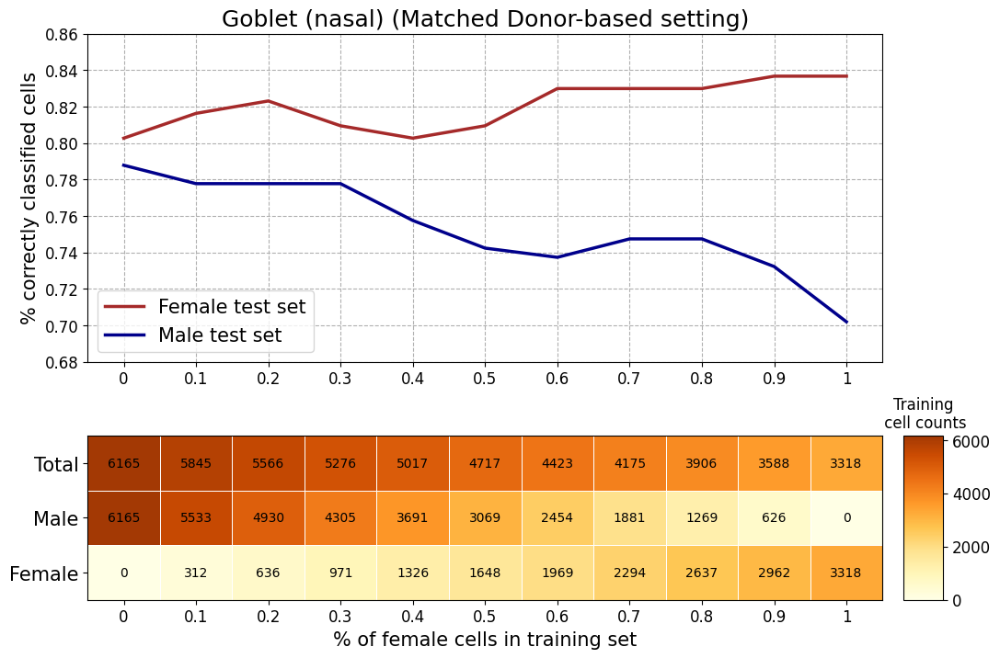

Goblet (nasal): 0.03092145949288811, -0.07116620752984389
ann_finest


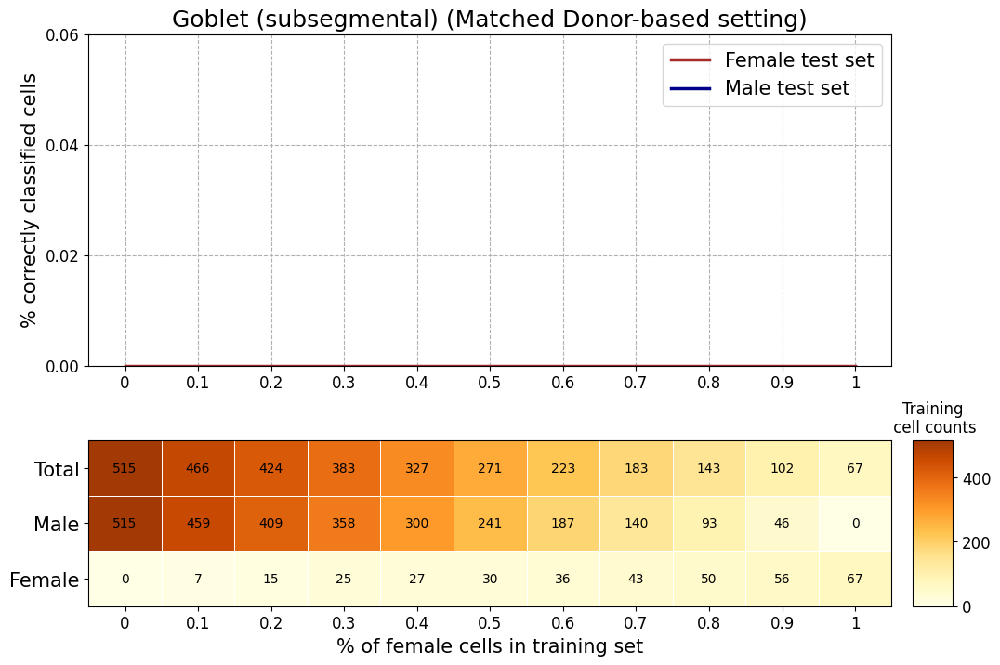

This cell type (Goblet (subsegmental)) contains NaN values in a test set. Skipping slope calculation.
Goblet (subsegmental): 0.0, None
ann_2


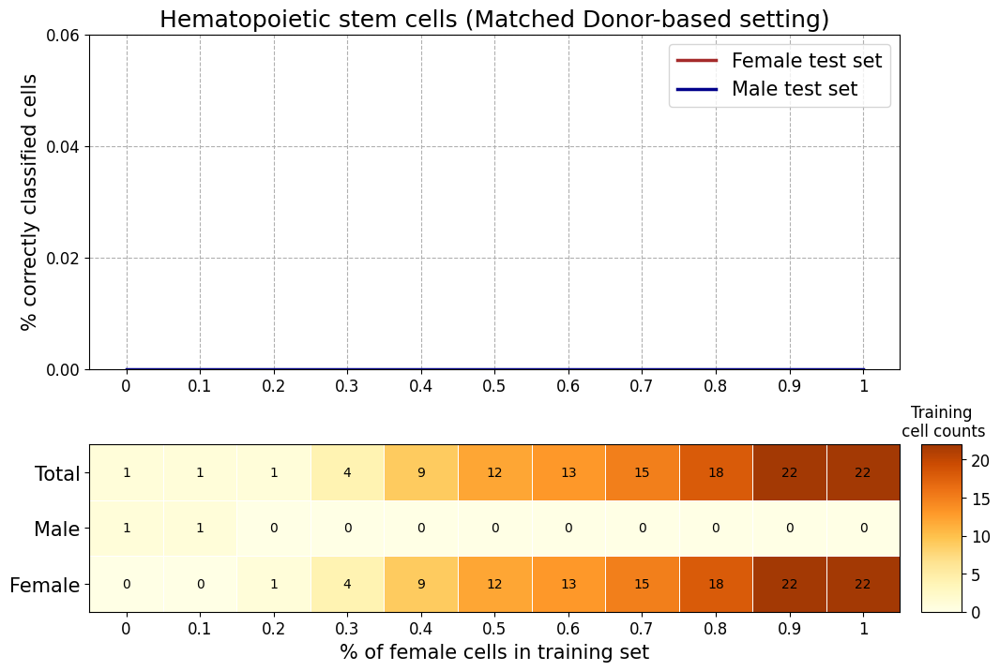

This cell type (Hematopoietic stem cells) contains NaN values in a test set. Skipping slope calculation.
Hematopoietic stem cells: None, 0.0
ann_finest


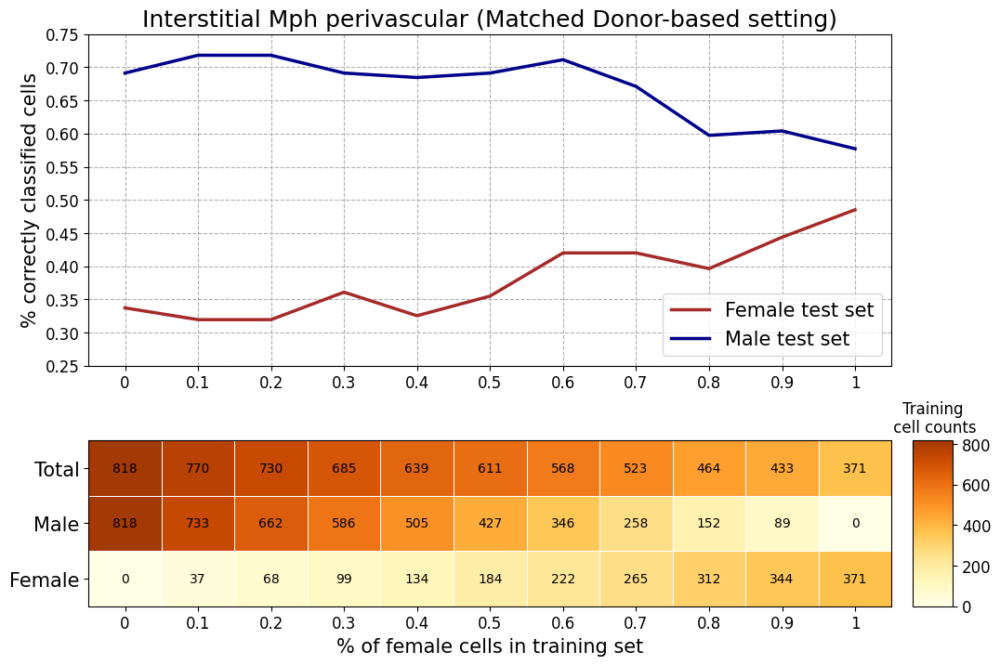

Interstitial Mph perivascular: 0.15277030661646046, -0.12751677852348992
ann_4


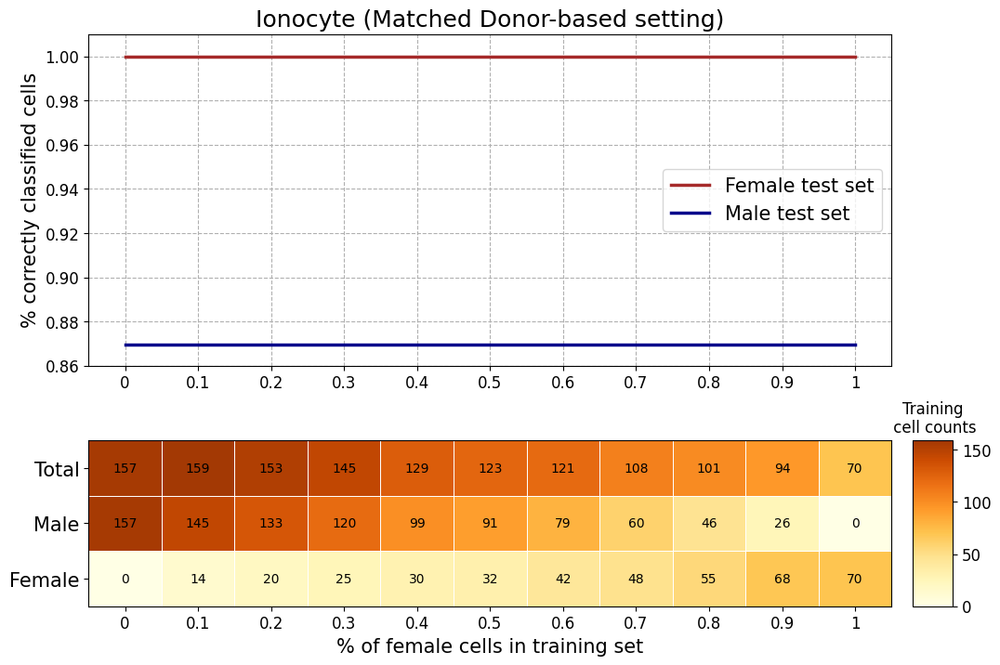

Ionocyte: 0.0, 0.0
ann_3


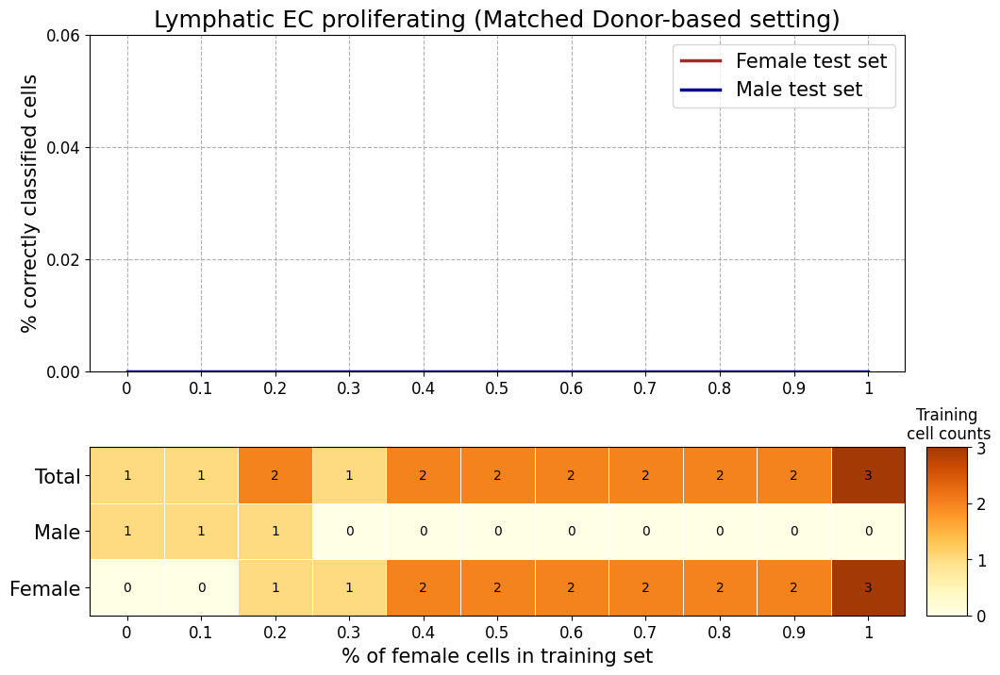

This cell type (Lymphatic EC proliferating) contains NaN values in a test set. Skipping slope calculation.
Lymphatic EC proliferating: None, 0.0
ann_3


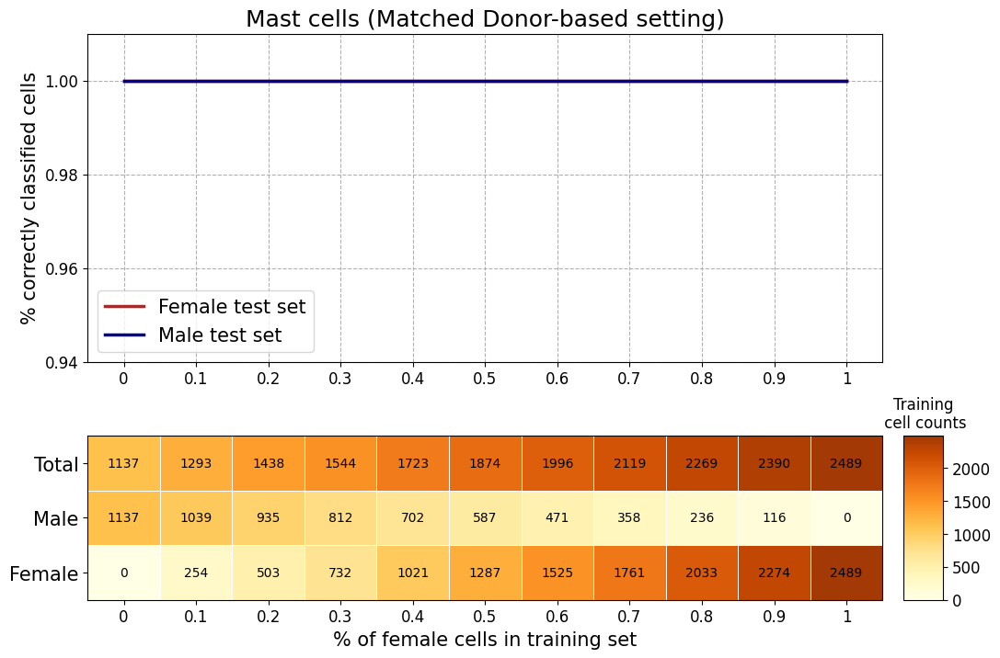

Mast cells: 0.0, 0.0
ann_4


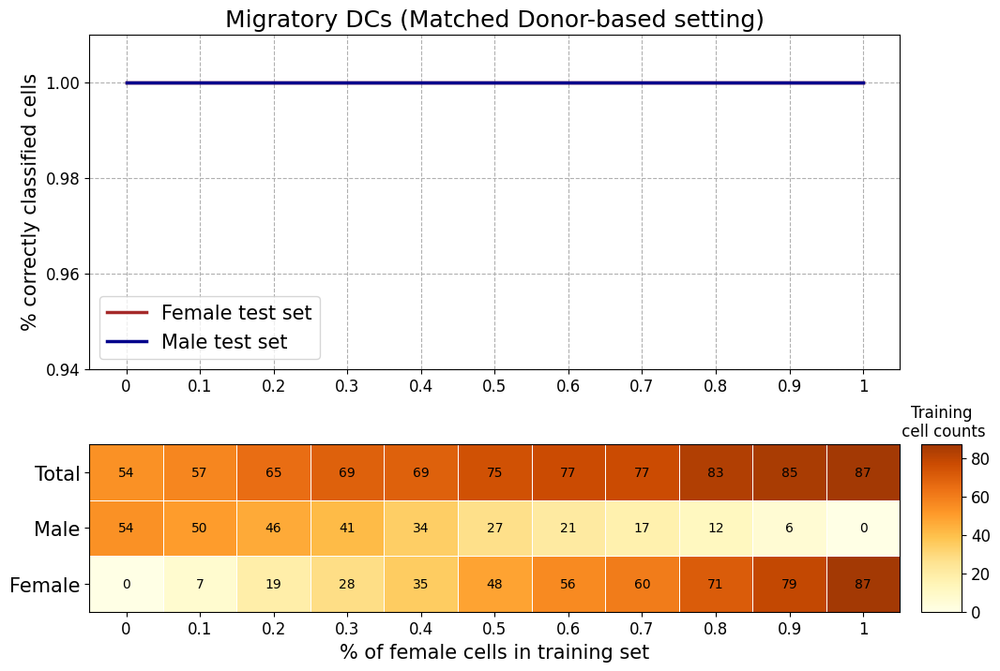

Migratory DCs: 0.0, 0.0
ann_finest


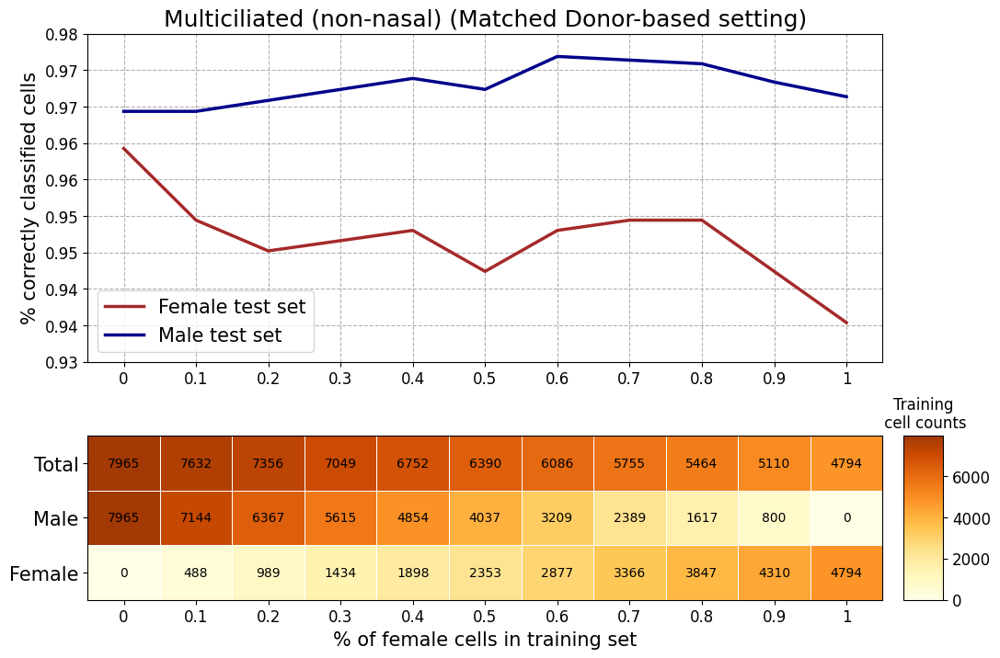

Multiciliated (non-nasal): -0.011746680286006108, 0.00474625775830596
ann_4


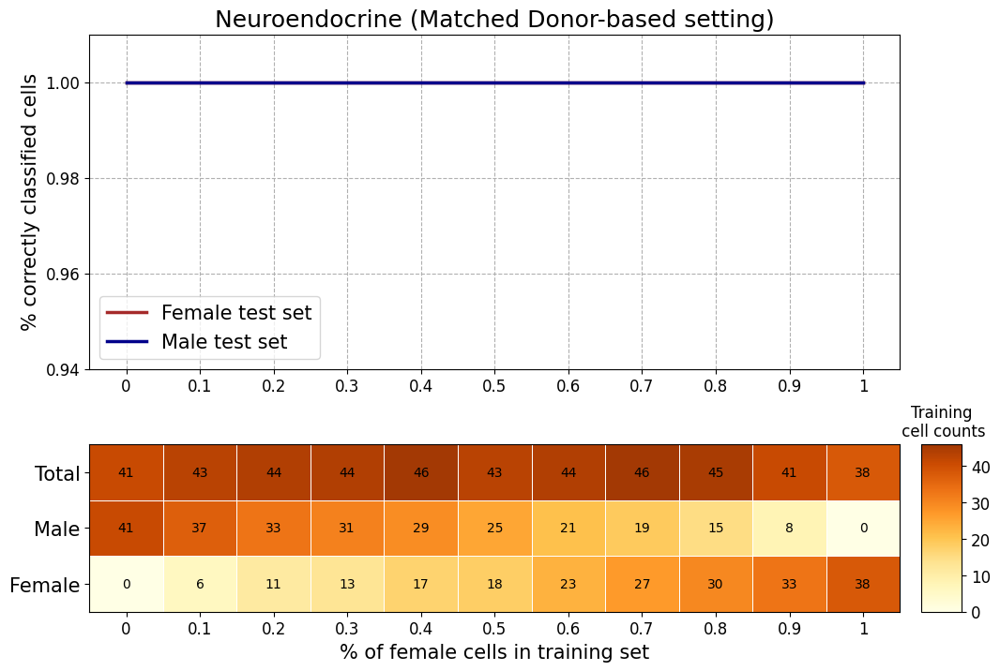

Neuroendocrine: 0.0, 0.0
ann_4


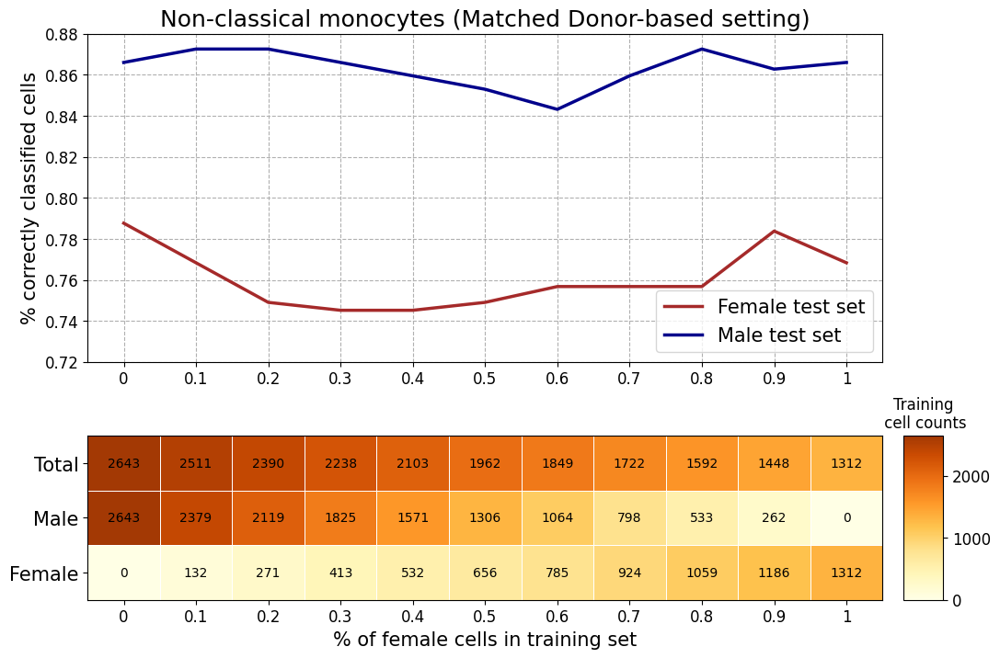

Non-classical monocytes: 0.002106002106002162, -0.0062388591800356386
ann_4


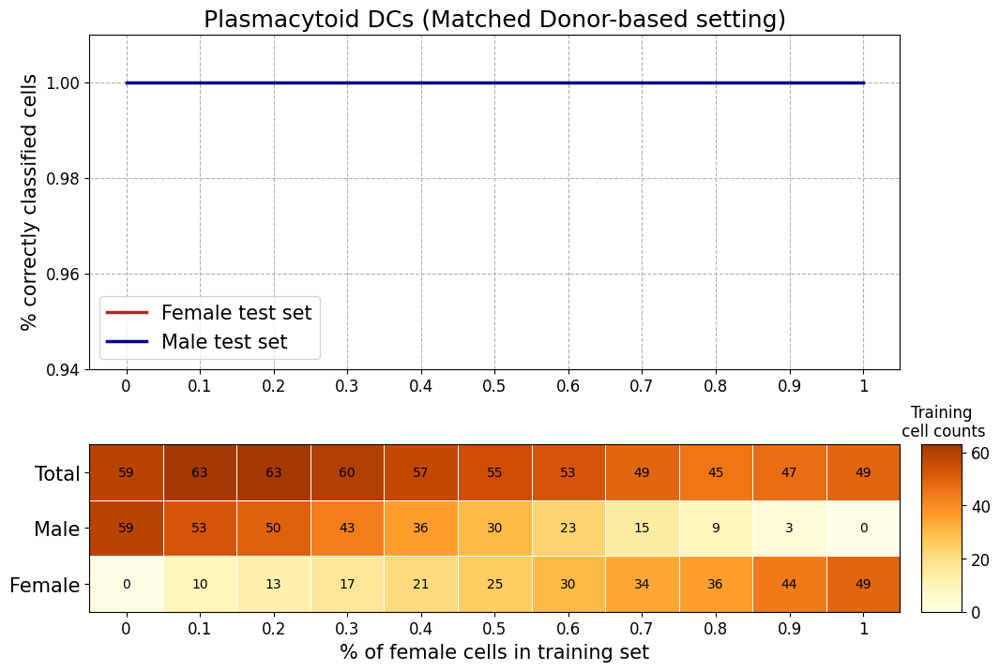

This cell type (Plasmacytoid DCs) contains NaN values in a test set. Skipping slope calculation.
Plasmacytoid DCs: None, 0.0
ann_4


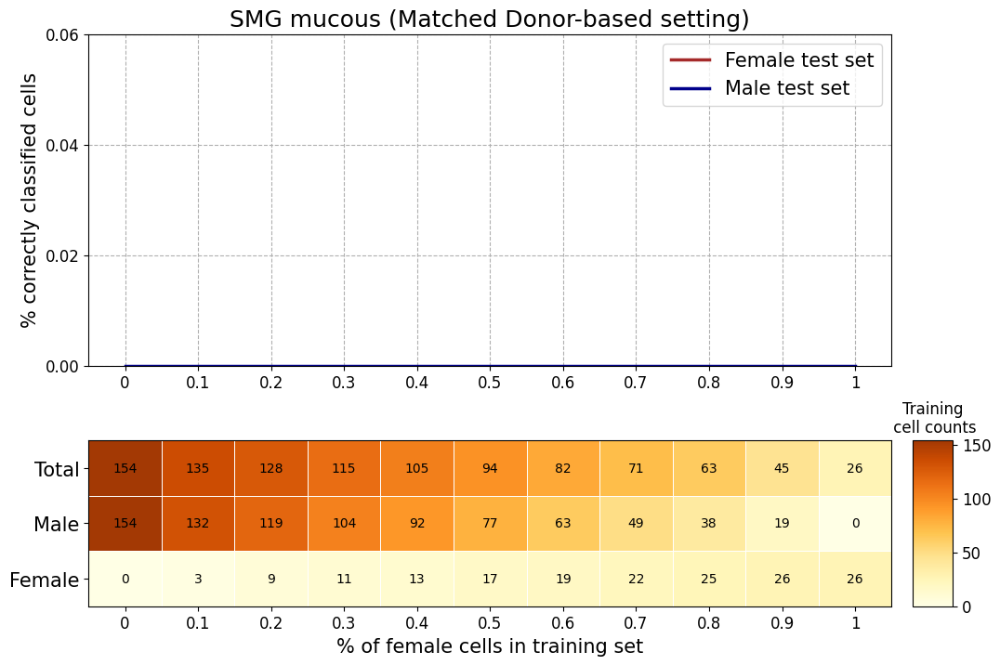

This cell type (SMG mucous) contains NaN values in a test set. Skipping slope calculation.
SMG mucous: None, 0.0
ann_finest


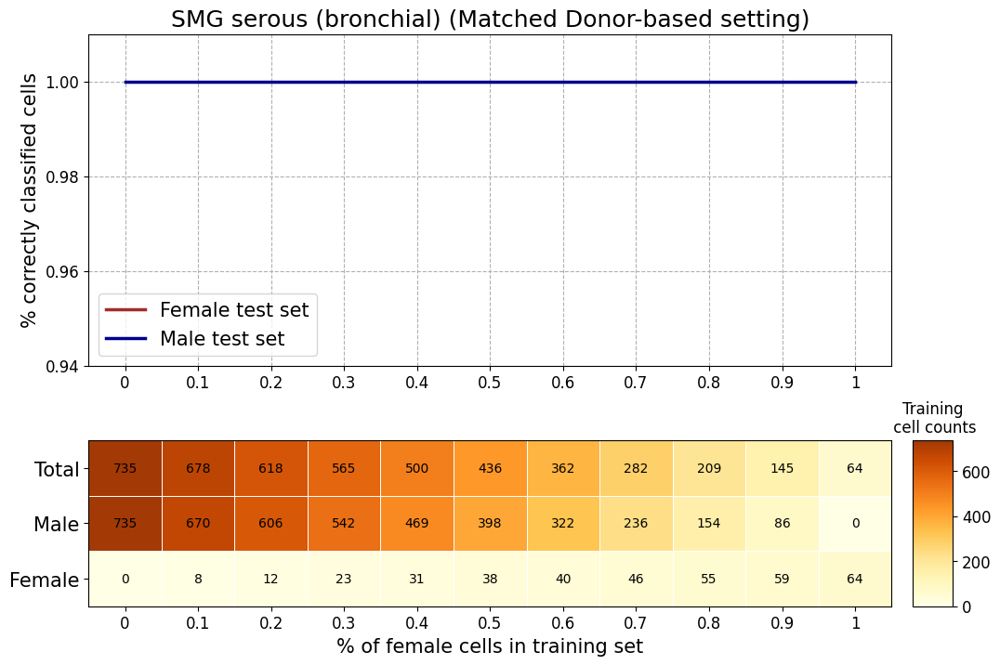

This cell type (SMG serous (bronchial)) contains NaN values in a test set. Skipping slope calculation.
SMG serous (bronchial): None, 0.0
ann_finest


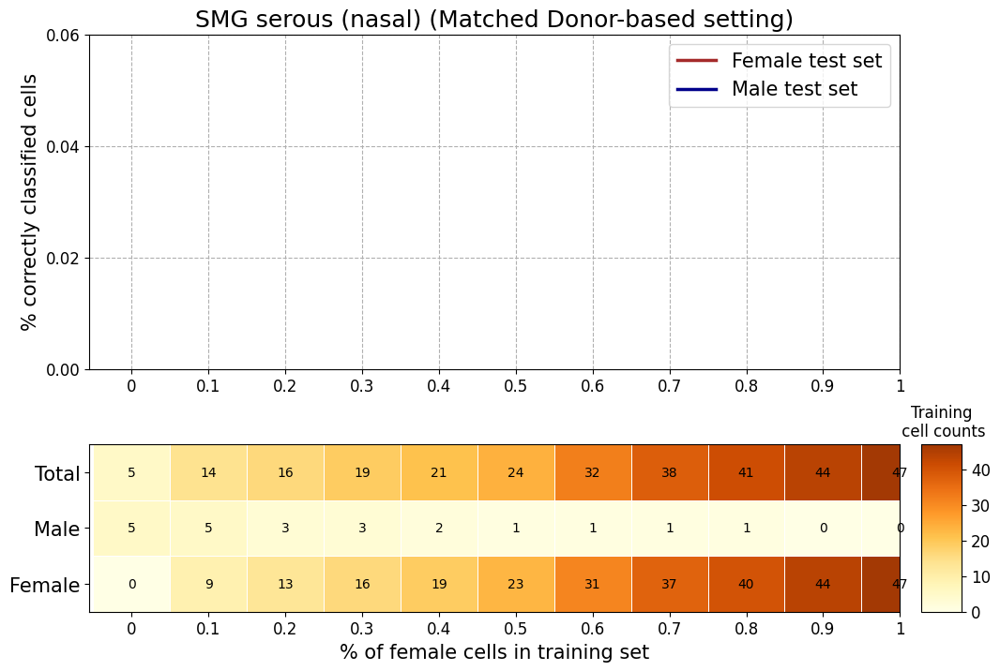

This cell type (SMG serous (nasal)) contains NaN values in a test set. Skipping slope calculation.
This cell type (SMG serous (nasal)) contains NaN values in a test set. Skipping slope calculation.
SMG serous (nasal): None, None
ann_3


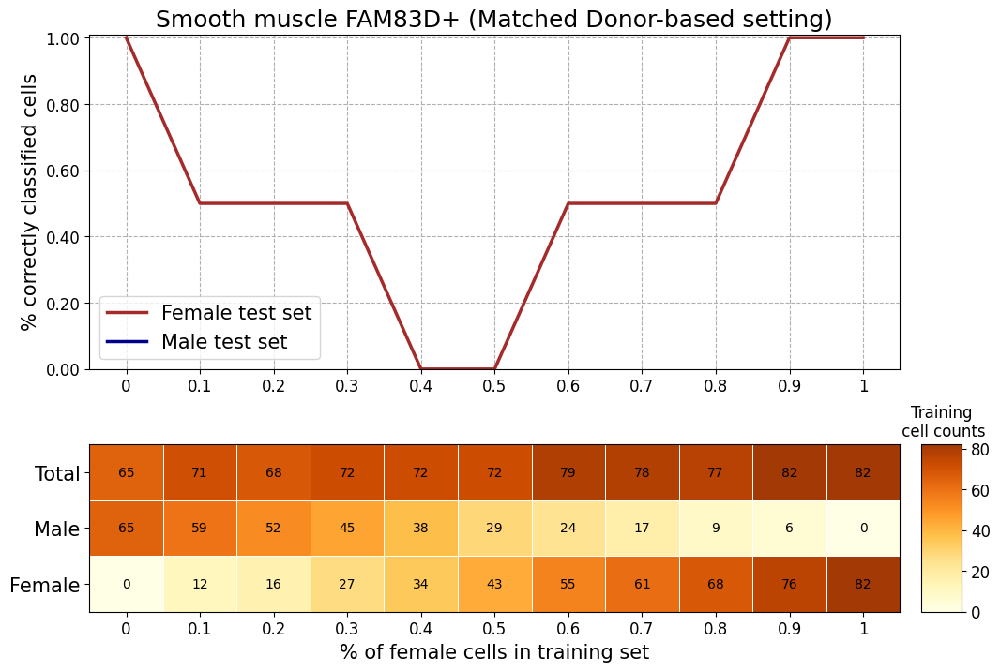

This cell type (Smooth muscle FAM83D+) contains NaN values in a test set. Skipping slope calculation.
Smooth muscle FAM83D+: 0.22727272727272732, None
ann_4


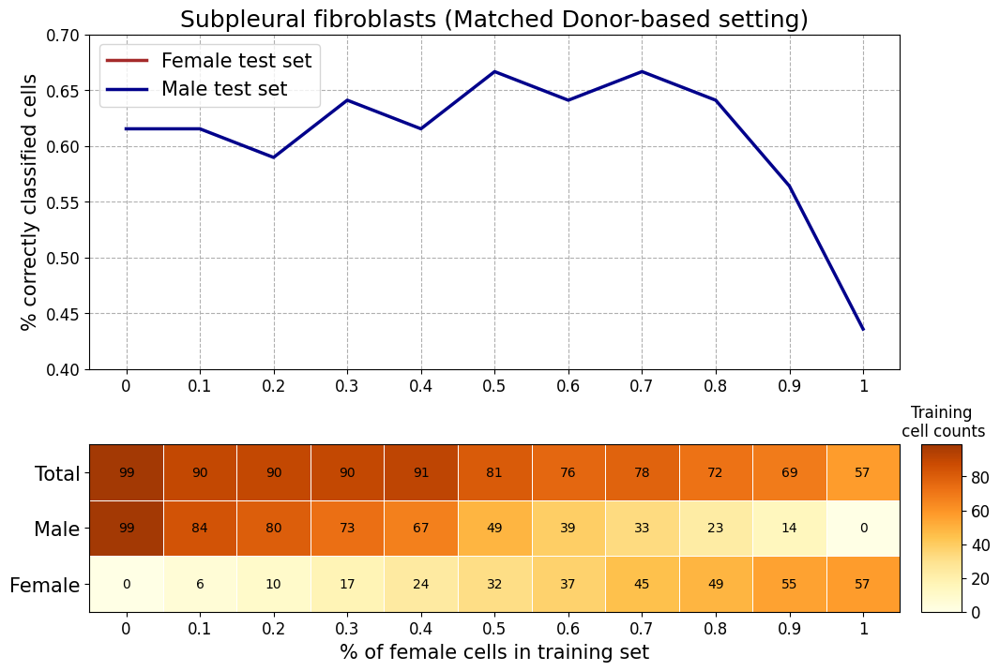

This cell type (Subpleural fibroblasts) contains NaN values in a test set. Skipping slope calculation.
Subpleural fibroblasts: None, -0.07925407925407932
ann_4


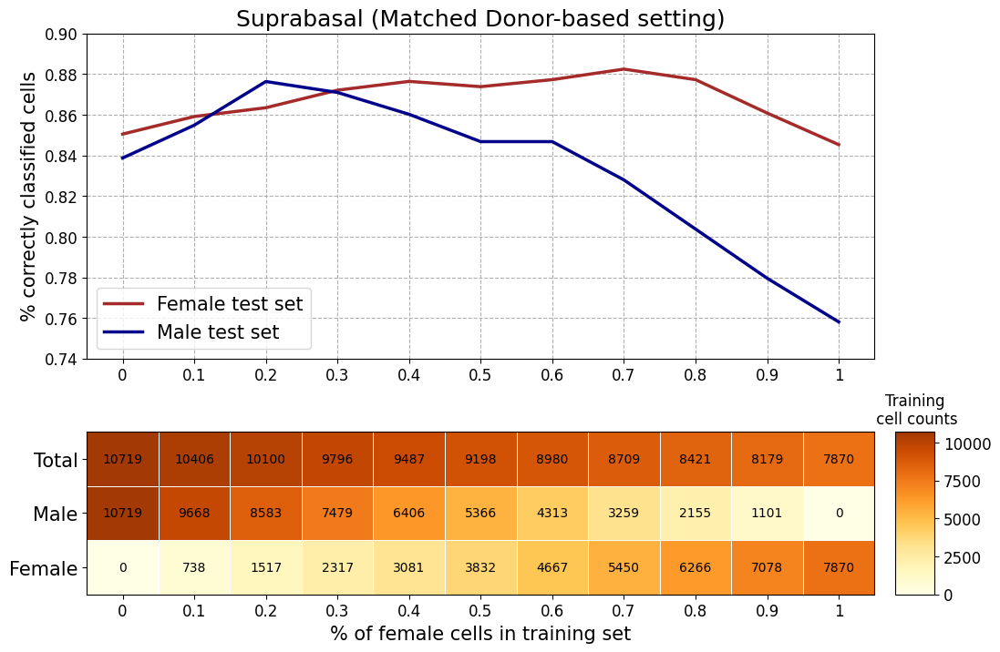

Suprabasal: 0.004007228726329807, -0.0928641251221897
ann_4


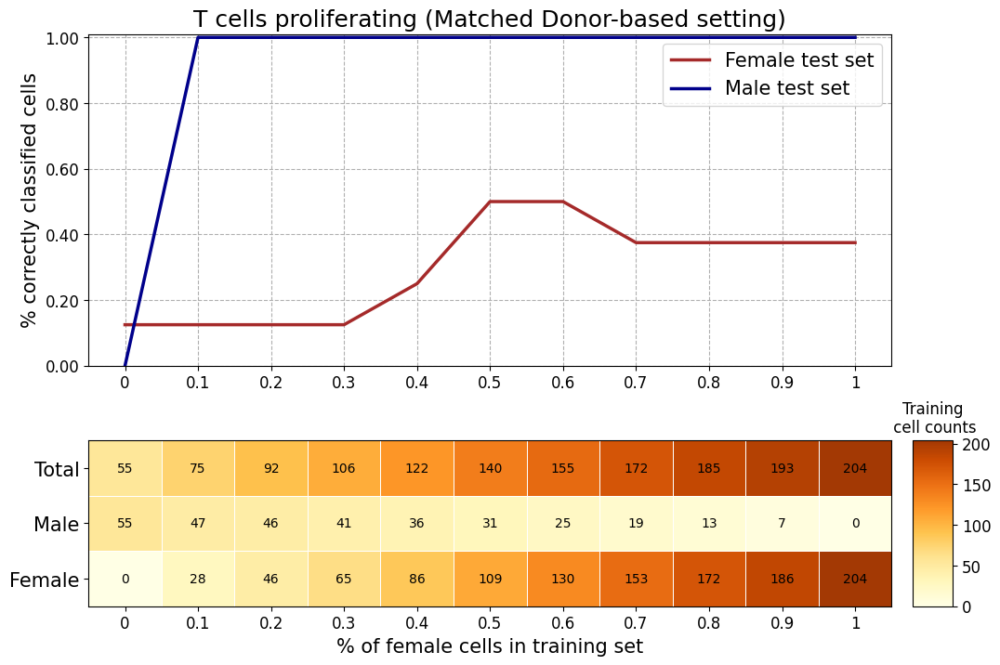

T cells proliferating: 0.340909090909091, 0.4545454545454546
ann_finest


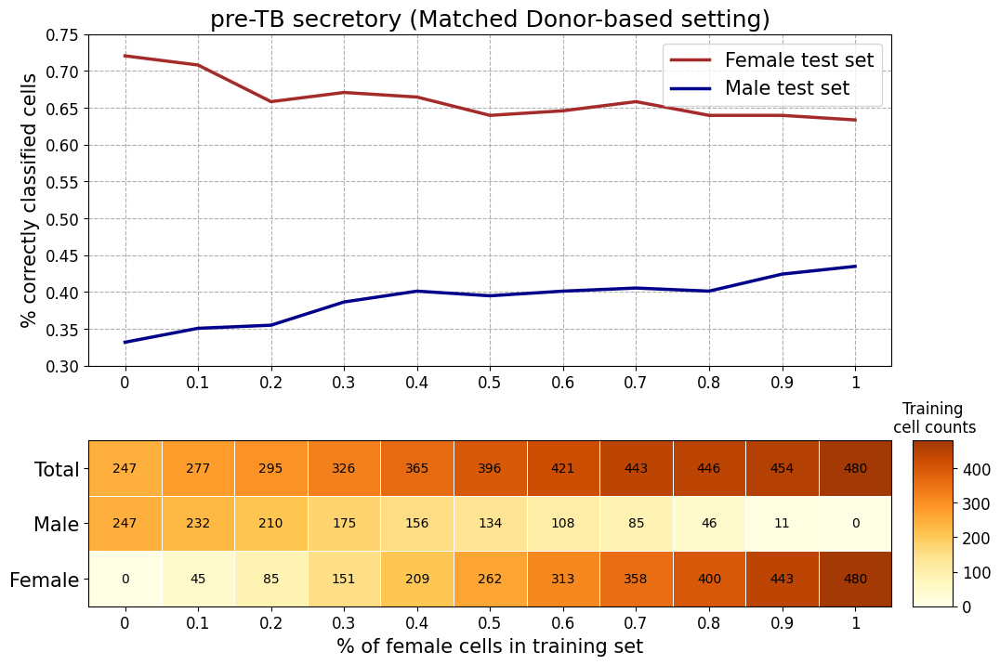

pre-TB secretory: -0.07340485601355173, 0.08957219251336901


In [15]:
inconclusive = results_df[results_df['Slope test'] != results_df['Flip test']]
for cell_type in inconclusive['Cell type']:
    ann_level = det_ann_level(cell_type, cell_names)
    male_lst, female_lst = gather_cms(general_path, 'seed42',  ann_level, cell_names, cell_type)
    (slope_female, slope_male), _, _ = opposing_tuple = plot_combined_classif(cell_type, cell_type, female_lst, male_lst, training_counts_dict[ann_level])
    print(f'{cell_type}: {slope_female}, {slope_male}')
    if slope_female and slope_male:
        if np.abs(slope_female) < 0.01 or np.abs(slope_male) < 0.01:
            results_df.loc[results_df['Cell type'] == cell_type, 'Classification trend'] = 'Inconclusive'
    else:
        results_df.loc[results_df['Cell type'] == cell_type, 'Classification trend'] = 'Inconclusive'

In [16]:
print(f'{len(results_df[results_df["Classification trend"] == "Distinct"])} cell types with distinct behavior.')
print(f'{len(results_df[results_df["Classification trend"] == "Non-distinct"])} cell types with non-distinct behavior.')
print(f'{len(results_df[results_df["Classification trend"] == "Inconclusive"])} cell types with inconclusive behavior.')

4 cell types with distinct behavior.
36 cell types with non-distinct behavior.
21 cell types with inconclusive behavior.


In [17]:
mask = (results_df['Maximum performance difference'] <= 0.041985)
results_df.loc[mask, 'Classification trend']

1     Non-distinct
2     Inconclusive
10    Inconclusive
11    Non-distinct
27    Inconclusive
28    Inconclusive
33    Non-distinct
34    Inconclusive
35    Inconclusive
37    Inconclusive
40    Inconclusive
43    Inconclusive
47        Distinct
48    Inconclusive
51    Inconclusive
52    Inconclusive
53    Inconclusive
54    Non-distinct
55    Inconclusive
56    Inconclusive
Name: Classification trend, dtype: object

In [18]:
### no 'distinct' cell types here, no need to set them to 'inconclusive'

In [19]:
with open(f'{path_results}/df_classification_trend.pickle', 'wb') as file:
    pickle.dump(results_df, file)

Supplementary table:

In [20]:
results_df.loc[:, 'Slope on male set'] = round(results_df.loc[:, 'Slope on male set'], 3)
results_df.loc[:, 'Slope on female set'] = round(results_df.loc[:, 'Slope on female set'], 3)
results_df.loc[:, 'Maximum performance difference'] = round(results_df.loc[:, 'Maximum performance difference'], 3)

with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(results_df.loc[:,["Cell type", "Slope on male set", "Slope on female set", "Slope test", "Flip test", "Maximum performance difference", "Classification trend"]])

                        Cell type  Slope on male set  Slope on female set  \
0                             AT0              0.079                0.124   
1                             AT1              0.057                0.080   
2                             AT2              0.010                0.001   
3               AT2 proliferating              0.483                0.112   
4         Adventitial fibroblasts             -0.021                0.069   
5              Alveolar Mph CCL3+             -0.455               -0.171   
6        Alveolar Mph MT-positive              0.788                0.494   
7      Alveolar Mph proliferating              0.086                0.424   
8            Alveolar fibroblasts              0.201                0.147   
9            Alveolar macrophages              0.106                0.045   
10                        B cells              0.000                0.000   
11                  Basal resting             -0.041               -0.068   

In [21]:
results_df.loc[:,["Cell type", "Slope on male set", "Slope on female set", "Slope test", "Flip test", "Maximum performance difference", "Classification trend"]].head(60)

,Cell type,Slope on male set,Slope on female set,Slope test,Flip test,Maximum performance difference,Classification trend
0,AT0,0.079,0.124,False,False,0.308,Non-distinct
1,AT1,0.057,0.080,False,True,0.037,Non-distinct
2,AT2,0.010,0.001,False,True,0.008,Inconclusive
3,AT2 proliferating,0.483,0.112,False,False,0.532,Non-distinct
4,Adventitial fibroblasts,-0.021,0.069,True,False,0.279,Non-distinct
5,Alveolar Mph CCL3+,-0.455,-0.171,False,False,0.448,Non-distinct
6,Alveolar Mph MT-positive,0.788,0.494,False,False,0.381,Non-distinct
7,Alveolar Mph proliferating,0.086,0.424,False,False,0.386,Non-distinct
8,Alveolar fibroblasts,0.201,0.147,False,False,0.171,Non-distinct
9,Alveolar macrophages,0.106,0.045,False,True,0.057,Non-distinct
